### ISC among twins and control analyses

The goal of this notebook is to measure ISC among twins and compare it against control-twins (i.e. age- and sex-matched controls) non-twins.

The hypothesis is that ISC for twin-pairs will be generally higher than for non-twin pairs (or controls). We will further concretize the control-analyses below and in the follow-up notebooks.

#### Import modules

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import sys, os, nilearn, pickle, glob, shutil, itertools, random
from nilearn import plotting, input_data, datasets
import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests
from utils import *
import warnings
from tqdm import tqdm
warnings.simplefilter("ignore")
from nilearn.masking import compute_brain_mask, apply_mask
from nilearn import image

#!pip install surfplot
#!pip install neuromaps
#!pip install matplotlib --upgrade

n_regions       = 293


#### Reading in Twin-list and computing ISC among twins

In [3]:
twin_df = pd.read_csv('../data/00_dataset_info/twin_df.csv')

twin_list = twin_df[['twin_A_id','twin_B_id']].values.tolist()
print(twin_list[:3])

twin_df.head()

[['sub-0001', 'sub-0018'], ['sub-0003', 'sub-0233'], ['sub-0004', 'sub-0420']]


,Unnamed: 0,family_id,twin_A_id,twin_A_age,twin_A_sex,twin_B_id,twin_B_age,twin_B_sex
0,0,fam-0001,sub-0001,14.0,M,sub-0018,14.0,M
1,1,fam-0116,sub-0003,14.0,M,sub-0233,14.0,F
2,2,fam-0002,sub-0004,11.0,M,sub-0420,11.0,M
3,3,fam-0088,sub-0005,12.0,F,sub-0178,12.0,F
4,4,fam-0178,sub-0006,15.0,M,sub-0329,15.0,F


In [4]:
# Computing ISC (functional) for the real twins
n_twins         = len(twin_list)
iscs_reg_twin   = np.zeros((n_regions+1, n_twins)) #the additional line is for the anatomical similarity

for curr_region in tqdm(range(n_regions)):
    twin_iscs      = []
    
    for twin_pair in twin_list:
        filename_1 = '../data/03_extract_ts/' + twin_pair[0] + '_LTR_Z_THP001_LP012_shen268_pauli16_aan9.npy'
        twin1_data = np.load(filename_1) 
        filename_2 = '../data/03_extract_ts/' + twin_pair[1] + '_LTR_Z_THP001_LP012_shen268_pauli16_aan9.npy'
        twin2_data = np.load(filename_2) 
        
        twin_iscs.append(np.corrcoef(twin1_data[:,curr_region], twin2_data[:,curr_region])[0,1])
 
    iscs_reg_twin[curr_region, :]   = twin_iscs

    
#anatomical similarity
#'''
anatomical_similarity_twins = []
for twin_pair in tqdm(twin_list):
        file_a = twin_pair[0]
        file_b = twin_pair[1] 

        f1 = '../data/04_anatomy/' + file_a + '_ses-02_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz'
        f1m = '../data/04_anatomy/' + file_a + '_ses-02_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'
        f1_masked = apply_mask(f1, compute_brain_mask(f1m, threshold=0.01, mask_type='whole-brain'))

        f2 = '../data/04_anatomy/' + file_b + '_ses-02_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz'
        f2m = '../data/04_anatomy/' + file_b + '_ses-02_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'
        f2_masked = apply_mask(f2, compute_brain_mask(f2m, threshold=0.01, mask_type='whole-brain'))

        anatomical_similarity_twins.append(np.corrcoef(f1_masked, f2_masked)[0,1])

iscs_reg_twin[293,:] = np.asarray(anatomical_similarity_twins) #'''


100%|██████████| 100/100 [32:28<00:00, 19.49s/it]


In [6]:
iscs_reg_twin.shape

(294, 100)

#### Reading in ControlTwin-List and computing ISC among control-twins

In [7]:
controltwin_df = pd.read_csv('../data/00_dataset_info/matched_controltwin_df.csv')

controltwin_list = controltwin_df[['twin_A_id','controltwin_B_id']].values.tolist()
print(controltwin_list[:3])

controltwin_df.head()

[['sub-0001', 'sub-0003'], ['sub-0004', 'sub-0151'], ['sub-0005', 'sub-0043']]


,family_id,twin_A_id,twin_A_age,twin_A_sex,controlfamily_id,controltwin_B_id,controltwin_B_age,controltwin_B_sex
0,fam-0001,sub-0001,14,M,fam-0116,sub-0003,14,M
1,fam-0002,sub-0004,11,M,fam-0038,sub-0151,11,M
2,fam-0088,sub-0005,12,F,fam-0151,sub-0043,12,F
3,fam-0178,sub-0006,15,M,fam-0007,sub-0017,15,M
4,fam-0003,sub-0007,10,F,fam-0137,sub-0261,10,F


In [8]:
# Computing ISC for the real twins
n_controltwins       = len(twin_list)
iscs_reg_controltwin = np.zeros((n_regions+1, n_controltwins))

for curr_region in tqdm(range(n_regions)):
    controltwin_iscs = []
    
    for controltwin_pair in controltwin_list:
        filename_1 = '../data/03_extract_ts/' + controltwin_pair[0] + '_LTR_Z_THP001_LP012_shen268_pauli16_aan9.npy'
        controltwin1_data = np.load(filename_1) 
        filename_2 = '../data/03_extract_ts/' + controltwin_pair[1] + '_LTR_Z_THP001_LP012_shen268_pauli16_aan9.npy'
        controltwin2_data = np.load(filename_2) 
        
        controltwin_iscs.append(np.corrcoef(controltwin1_data[:,curr_region], controltwin2_data[:,curr_region])[0,1])
 
    iscs_reg_controltwin[curr_region, :]   = controltwin_iscs
    

#anatomical similarity
#'''
anatomical_similarity_controltwins = []
for controltwin_pair in tqdm(controltwin_list):
        file_a = controltwin_pair[0]
        file_b = controltwin_pair[1] 

        f1  = '../data/04_anatomy/' + file_a + '_ses-02_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz'
        f1m = '../data/04_anatomy/' + file_a + '_ses-02_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'
        f1_masked = apply_mask(f1, compute_brain_mask(f1m, threshold=0.01, mask_type='whole-brain'))

        f2  = '../data/04_anatomy/' + file_b + '_ses-02_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz'
        f2m = '../data/04_anatomy/' + file_b + '_ses-02_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'
        f2_masked = apply_mask(f2, compute_brain_mask(f2m, threshold=0.01, mask_type='whole-brain'))

        anatomical_similarity_controltwins.append(np.corrcoef(f1_masked, f2_masked)[0,1])

iscs_reg_controltwin[293,:] = np.asarray(anatomical_similarity_controltwins) #'''


100%|██████████| 100/100 [31:17<00:00, 18.77s/it]


In [10]:
iscs_reg_controltwin.shape

(294, 100)

#### Computing ISC among random people

In [187]:
iscs_reg_notwin = np.zeros((n_regions+1, n_twins))

for curr_region in tqdm(range(n_regions)):
    no_twin_iscs      = []

    for twin_pair in twin_list:
        filename_1 = '../data/03_extract_ts/' + twin_pair[0] + '_LTR_Z_THP001_LP012_shen268_pauli16_aan9.npy'
        twin1_data = np.load(filename_1) 

        #from the remaining people, randomly chose one, excluding the actual twin
        other_twin_list = twin_df['twin_B_id'].values.tolist()
        other_people = [x for x in other_twin_list if x != twin_pair[1]]  
        no_twin_filename_1 = '../data/03_extract_ts/' + random.choice(other_people) + '_LTR_Z_THP001_LP012_shen268_pauli16_aan9.npy'
        no_twin_data1 = np.load(no_twin_filename_1) 

        no_twin_iscs.append(np.corrcoef(twin1_data[:,curr_region], no_twin_data1[:,curr_region])[0,1])

    iscs_reg_notwin[curr_region, :] = no_twin_iscs
    
    
#anatomical similarity
#'''
anatomical_similarity_notwins = []
for notwin_pair in tqdm(twin_list):
        file_a = notwin_pair[0]
        #file_b = notwin_pair[1] #this is wrong! 
        #from the remaining people, randomly chose one, excluding the actual twin
        other_twin_list = twin_df['twin_B_id'].values.tolist()
        other_people = [x for x in other_twin_list if x != twin_pair[1]]  
        file_b = random.choice(other_people) #this is wrong! 
        print(file_b)

        f1  = '../data/04_anatomy/' + file_a + '_ses-02_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz'
        f1m = '../data/04_anatomy/' + file_a + '_ses-02_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'
        f1_masked = apply_mask(f1, compute_brain_mask(f1m, threshold=0.01, mask_type='whole-brain'))
        

        f2  = '../data/04_anatomy/' + file_b + '_ses-02_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz'
        f2m = '../data/04_anatomy/' + file_b + '_ses-02_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'
        f2_masked = apply_mask(f2, compute_brain_mask(f2m, threshold=0.01, mask_type='whole-brain'))

        anatomical_similarity_notwins.append(np.corrcoef(f1_masked, f2_masked)[0,1])

iscs_reg_notwin[293,:] = np.asarray(anatomical_similarity_notwins) #'''


  0%|          | 0/100 [00:00<?, ?it/s]

sub-0272


  1%|          | 1/100 [00:18<31:14, 18.94s/it]

sub-0331


  2%|▏         | 2/100 [00:41<34:04, 20.86s/it]

sub-0314


  3%|▎         | 3/100 [00:58<31:21, 19.39s/it]

sub-0353


  4%|▍         | 4/100 [01:16<29:47, 18.62s/it]

sub-0295


  5%|▌         | 5/100 [01:33<28:43, 18.14s/it]

sub-0340


  6%|▌         | 6/100 [01:50<28:03, 17.91s/it]

sub-0388


  7%|▋         | 7/100 [02:08<27:28, 17.72s/it]

sub-0372


  8%|▊         | 8/100 [02:25<27:00, 17.61s/it]

sub-0302


  9%|▉         | 9/100 [02:42<26:33, 17.51s/it]

sub-0366


 10%|█         | 10/100 [03:00<26:11, 17.46s/it]

sub-0353


 11%|█         | 11/100 [03:17<25:48, 17.40s/it]

sub-0111


 12%|█▏        | 12/100 [03:34<25:30, 17.39s/it]

sub-0174


 13%|█▎        | 13/100 [03:52<25:06, 17.32s/it]

sub-0328


 14%|█▍        | 14/100 [04:09<24:50, 17.34s/it]

sub-0233


 15%|█▌        | 15/100 [04:26<24:31, 17.31s/it]

sub-0334


 16%|█▌        | 16/100 [04:44<24:15, 17.33s/it]

sub-0246


 17%|█▋        | 17/100 [05:01<24:06, 17.43s/it]

sub-0295


 18%|█▊        | 18/100 [05:19<23:45, 17.38s/it]

sub-0328


 19%|█▉        | 19/100 [05:36<23:23, 17.32s/it]

sub-0199


 20%|██        | 20/100 [05:53<23:09, 17.37s/it]

sub-0420


 21%|██        | 21/100 [06:11<22:56, 17.42s/it]

sub-0183


 22%|██▏       | 22/100 [06:28<22:38, 17.41s/it]

sub-0214


 23%|██▎       | 23/100 [06:46<22:21, 17.42s/it]

sub-0314


 24%|██▍       | 24/100 [07:03<22:08, 17.48s/it]

sub-0273


 25%|██▌       | 25/100 [07:21<21:47, 17.43s/it]

sub-0421


 26%|██▌       | 26/100 [07:38<21:29, 17.43s/it]

sub-0226


 27%|██▋       | 27/100 [07:58<22:14, 18.29s/it]

sub-0078


 28%|██▊       | 28/100 [08:17<22:00, 18.34s/it]

sub-0257


 29%|██▉       | 29/100 [08:35<21:31, 18.19s/it]

sub-0151


 30%|███       | 30/100 [08:52<20:52, 17.89s/it]

sub-0357


 31%|███       | 31/100 [09:09<20:27, 17.78s/it]

sub-0378


 32%|███▏      | 32/100 [09:26<19:55, 17.58s/it]

sub-0340


 33%|███▎      | 33/100 [09:44<19:31, 17.48s/it]

sub-0279


 34%|███▍      | 34/100 [10:01<19:11, 17.44s/it]

sub-0263


 35%|███▌      | 35/100 [10:18<18:53, 17.44s/it]

sub-0374


 36%|███▌      | 36/100 [10:36<18:33, 17.40s/it]

sub-0279


 37%|███▋      | 37/100 [11:01<20:47, 19.80s/it]

sub-0018


 38%|███▊      | 38/100 [11:31<23:31, 22.76s/it]

sub-0417


 39%|███▉      | 39/100 [12:00<25:00, 24.60s/it]

sub-0337


 40%|████      | 40/100 [12:28<25:49, 25.83s/it]

sub-0120


 41%|████      | 41/100 [12:54<25:27, 25.88s/it]

sub-0372


 42%|████▏     | 42/100 [13:21<25:11, 26.07s/it]

sub-0419


 43%|████▎     | 43/100 [13:45<24:16, 25.55s/it]

sub-0419


 44%|████▍     | 44/100 [14:12<24:14, 25.97s/it]

sub-0086


 45%|████▌     | 45/100 [14:40<24:22, 26.60s/it]

sub-0232


 46%|████▌     | 46/100 [15:07<24:03, 26.73s/it]

sub-0363


 47%|████▋     | 47/100 [15:32<23:08, 26.19s/it]

sub-0295


 48%|████▊     | 48/100 [15:58<22:31, 26.00s/it]

sub-0396


 49%|████▉     | 49/100 [16:23<21:59, 25.87s/it]

sub-0078


 50%|█████     | 50/100 [16:49<21:35, 25.91s/it]

sub-0340


 51%|█████     | 51/100 [17:18<21:53, 26.81s/it]

sub-0233


 52%|█████▏    | 52/100 [17:44<21:14, 26.55s/it]

sub-0385


 53%|█████▎    | 53/100 [18:09<20:30, 26.17s/it]

sub-0213


 54%|█████▍    | 54/100 [18:38<20:35, 26.86s/it]

sub-0314


 55%|█████▌    | 55/100 [19:06<20:28, 27.29s/it]

sub-0295


 56%|█████▌    | 56/100 [19:34<20:09, 27.49s/it]

sub-0188


 57%|█████▋    | 57/100 [20:01<19:30, 27.22s/it]

sub-0284


 58%|█████▊    | 58/100 [20:29<19:17, 27.55s/it]

sub-0213


 59%|█████▉    | 59/100 [20:57<18:50, 27.58s/it]

sub-0419


 60%|██████    | 60/100 [21:24<18:17, 27.44s/it]

sub-0078


 61%|██████    | 61/100 [21:49<17:24, 26.77s/it]

sub-0314


 62%|██████▏   | 62/100 [22:18<17:16, 27.29s/it]

sub-0417


 63%|██████▎   | 63/100 [22:44<16:42, 27.10s/it]

sub-0353


 64%|██████▍   | 64/100 [23:05<15:10, 25.29s/it]

sub-0255


 65%|██████▌   | 65/100 [23:22<13:18, 22.82s/it]

sub-0241


 66%|██████▌   | 66/100 [23:39<11:55, 21.04s/it]

sub-0263


 67%|██████▋   | 67/100 [23:56<10:52, 19.78s/it]

sub-0340


 68%|██████▊   | 68/100 [24:13<10:05, 18.91s/it]

sub-0321


 69%|██████▉   | 69/100 [24:30<09:27, 18.31s/it]

sub-0226


 70%|███████   | 70/100 [24:47<08:56, 17.89s/it]

sub-0292


 71%|███████   | 71/100 [25:04<08:30, 17.60s/it]

sub-0272


 72%|███████▏  | 72/100 [25:21<08:08, 17.45s/it]

sub-0378


 73%|███████▎  | 73/100 [25:38<07:47, 17.32s/it]

sub-0322


 74%|███████▍  | 74/100 [25:55<07:27, 17.21s/it]

sub-0337


 75%|███████▌  | 75/100 [26:12<07:08, 17.14s/it]

sub-0317


 76%|███████▌  | 76/100 [26:29<06:49, 17.04s/it]

sub-0199


 77%|███████▋  | 77/100 [26:45<06:30, 16.98s/it]

sub-0366


 78%|███████▊  | 78/100 [27:03<06:15, 17.05s/it]

sub-0403


 79%|███████▉  | 79/100 [27:19<05:56, 16.97s/it]

sub-0401


 80%|████████  | 80/100 [27:36<05:38, 16.94s/it]

sub-0363


 81%|████████  | 81/100 [27:53<05:21, 16.92s/it]

sub-0338


 82%|████████▏ | 82/100 [28:10<05:06, 17.04s/it]

sub-0295


 83%|████████▎ | 83/100 [28:27<04:48, 16.99s/it]

sub-0164


 84%|████████▍ | 84/100 [28:44<04:31, 16.94s/it]

sub-0374


 85%|████████▌ | 85/100 [29:01<04:15, 17.01s/it]

sub-0284


 86%|████████▌ | 86/100 [29:18<03:58, 17.04s/it]

sub-0376


 87%|████████▋ | 87/100 [29:35<03:41, 17.00s/it]

sub-0174


 88%|████████▊ | 88/100 [29:52<03:23, 16.93s/it]

sub-0408


 89%|████████▉ | 89/100 [30:09<03:06, 16.99s/it]

sub-0419


 90%|█████████ | 90/100 [30:26<02:50, 17.03s/it]

sub-0249


 91%|█████████ | 91/100 [30:43<02:32, 17.00s/it]

sub-0376


 92%|█████████▏| 92/100 [31:01<02:16, 17.09s/it]

sub-0263


 93%|█████████▎| 93/100 [31:17<01:59, 17.03s/it]

sub-0365


 94%|█████████▍| 94/100 [31:35<01:42, 17.03s/it]

sub-0418


 95%|█████████▌| 95/100 [31:51<01:24, 16.99s/it]

sub-0246


 96%|█████████▌| 96/100 [32:08<01:07, 17.00s/it]

sub-0259


 97%|█████████▋| 97/100 [32:25<00:50, 16.95s/it]

sub-0403


 98%|█████████▊| 98/100 [32:42<00:33, 16.90s/it]

sub-0048


 99%|█████████▉| 99/100 [33:03<00:18, 18.26s/it]

sub-0357


100%|██████████| 100/100 [33:30<00:00, 20.10s/it]


In [188]:
iscs_reg_notwin.shape

(294, 100)

In [189]:
results_dictionary = {}
results_dictionary['isc_reg_twin'] = iscs_reg_twin;
results_dictionary['isc_reg_controltwin'] = iscs_reg_controltwin;
results_dictionary['isc_reg_notwin'] = iscs_reg_notwin;


f = open("../data/05_results/isc_twin_controls_notwins.pkl","wb")
pickle.dump(results_dictionary, f)
f.close()

In [190]:
pickle_in = open("../data/05_results/isc_twin_controls_notwins.pkl","rb")
example_dict = pickle.load(pickle_in)
example_dict['isc_reg_twin'].shape

(294, 100)

#### Compute averages and plot

In [191]:
reg_mean_twin_iscs        = np.mean(iscs_reg_twin, axis = 1)
reg_mean_controltwin_iscs = np.mean(iscs_reg_controltwin, axis = 1)
reg_mean_notwin_iscs      = np.mean(iscs_reg_notwin, axis = 1)

print(reg_mean_twin_iscs.shape)
print(reg_mean_controltwin_iscs.shape)
print(reg_mean_notwin_iscs.shape)

(294,)
(294,)
(294,)


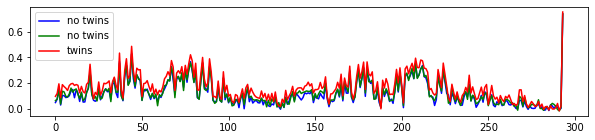

In [192]:
plt.figure(figsize = (10,2));
plt.plot(reg_mean_notwin_iscs, color = 'blue', label='no twins');
plt.plot(reg_mean_controltwin_iscs, color = 'green', label='no twins');
plt.plot(reg_mean_twin_iscs, color = 'red', label='twins');
plt.legend();

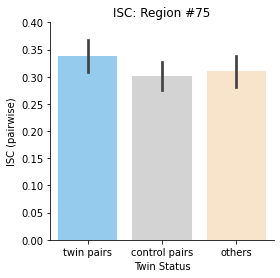

In [80]:
current_region_index = 75
#293 is anatomical_similarity


df0 = pd.DataFrame(np.vstack(( iscs_reg_notwin[current_region_index,:], 
                   len(iscs_reg_notwin[current_region_index,:]) * ['others'] )).T, 
                  columns = ['ISC','Twin Status'])

df1 = pd.DataFrame(np.vstack(( iscs_reg_controltwin[current_region_index,:], 
                   len(iscs_reg_controltwin[current_region_index,:]) * ['control pairs'] )).T, 
                   columns = ['ISC','Twin Status'])

df2 = pd.DataFrame(np.vstack(( iscs_reg_twin[current_region_index,:], 
                   len(iscs_reg_twin[current_region_index,:]) * ['twin pairs'] )).T, 
                   columns = ['ISC','Twin Status'])

result_df = pd.concat([df2, df1, df0])
del df1, df2, df0

result_df['ISC'] = result_df['ISC'].astype('float')

plt.figure(figsize =  (4,4))
sns.barplot(data=result_df, 
            x="Twin Status", 
            y="ISC",
            palette = [ 'lightskyblue','lightgrey','bisque']).set(title='ISC: Region #' + str(current_region_index));
plt.ylim([0, 0.4])
plt.ylabel('ISC (pairwise)');
sns.despine()

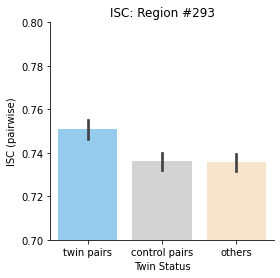

In [198]:
current_region_index = 293
#293 is anatomical_similarity


df0 = pd.DataFrame(np.vstack(( iscs_reg_notwin[current_region_index,:], 
                   len(iscs_reg_notwin[current_region_index,:]) * ['others'] )).T, 
                  columns = ['ISC','Twin Status'])

df1 = pd.DataFrame(np.vstack(( iscs_reg_controltwin[current_region_index,:], 
                   len(iscs_reg_controltwin[current_region_index,:]) * ['control pairs'] )).T, 
                   columns = ['ISC','Twin Status'])

df2 = pd.DataFrame(np.vstack(( iscs_reg_twin[current_region_index,:], 
                   len(iscs_reg_twin[current_region_index,:]) * ['twin pairs'] )).T, 
                   columns = ['ISC','Twin Status'])

result_df = pd.concat([df2, df1, df0])
del df1, df2, df0

result_df['ISC'] = result_df['ISC'].astype('float')

plt.figure(figsize =  (4,4))
sns.barplot(data=result_df, 
            x="Twin Status", 
            y="ISC",
            palette = [ 'lightskyblue','lightgrey','bisque']).set(title='ISC: Region #' + str(current_region_index));
plt.ylim([0.7, 0.8])
plt.ylabel('ISC (pairwise)');
sns.despine()

In [199]:
result_df.to_csv('../data/05_results/twin_isc_df.csv')

{'coords': [18.03679369250986, -83.38764783180027, -11.250985545335084], 'name': '60.71% Occipital_Fusiform_Gyrus; 21.94% Lingual_Gyrus; 17.21% Occipital_Pole', 'index_label': 76, 'data_array_index': 75}


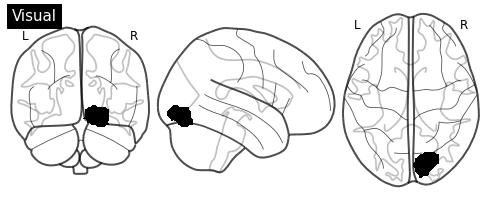

{'coords': [48.86702127659574, -58.01329787234043, 14.295212765957444], 'name': '35.64% Angular_Gyrus; 25.13% Middle_Temporal_Gyrus_temporooccipital_part; 22.21% Lateral_Occipital_Cortex_inferior_division; 16.62% Lateral_Occipital_Cortex_superior_division', 'index_label': 50, 'data_array_index': 49}


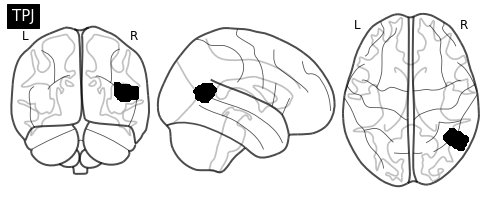

{'coords': [-51.31847133757961, -56.269639065817415, 20.494692144373673], 'name': '54.25% Angular_Gyrus; 17.20% Lateral_Occipital_Cortex_superior_division; 16.45% Supramarginal_Gyrus_posterior_division; 8.92% Middle_Temporal_Gyrus_temporooccipital_part', 'index_label': 183, 'data_array_index': 182}


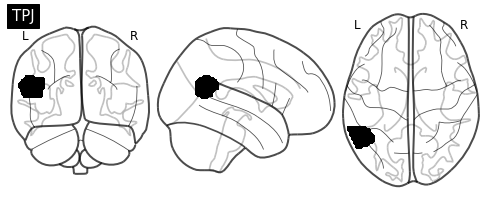

{'coords': [8.283887468030684, 46.05882352941177, -1.6700767263427139], 'name': '47.25% Paracingulate_Gyrus; 25.03% Cingulate_Gyrus_anterior_division; 16.35% Frontal_Medial_Cortex; 10.86% Frontal_Pole', 'index_label': 5, 'data_array_index': 4}


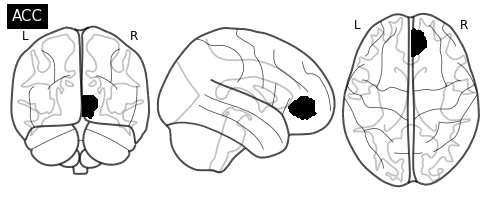

In [61]:
from nilearn.image import new_img_like

shen_pauli_aan_dict = np.load('../data//02_rois_masks_maps/shen_pauli_aan_dict.npy', allow_pickle=True).item()

key_regions         = [76, 50, 183, 5] #np.arange(1,294)

key_regions_label   = ['Visual', 'TPJ', 'TPJ', 'ACC']
colorlist           = ['black' ] * len(key_regions) 

for count in range(len(key_regions)):#3):  
    
    curr_region_dictidx = key_regions[count]
    print(shen_pauli_aan_dict[curr_region_dictidx])
    
    all_file       = '../data/02_rois_masks_maps/allcombined.nii'
    all_img        = nilearn.image.load_img(all_file)
    all_data       = all_img.get_fdata()

    all_data[np.where(all_data!= curr_region_dictidx)] = 0
    all_new_img    = new_img_like(all_img, all_data.astype(int))

    current_title  = key_regions_label[count]
    display = plotting.plot_glass_brain(None,
                                       title = current_title)
    display.add_contours(all_new_img, filled=True, colors=colorlist[count])
    plt.show()


{'coords': [14.083200000000005, 56.6944, -16.684799999999996], 'name': '92.80% Frontal_Pole; 7.20% Frontal_Medial_Cortex', 'index_label': 1, 'data_array_index': 0}


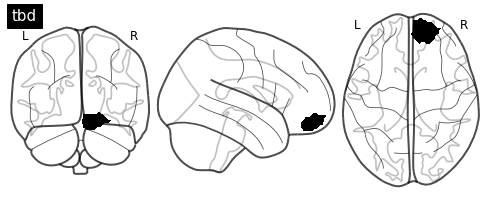

{'coords': [9.599999999999994, 17.61882352941177, -19.53411764705882], 'name': '60.56% Subcallosal_Cortex; 38.73% Frontal_Orbital_Cortex', 'index_label': 2, 'data_array_index': 1}


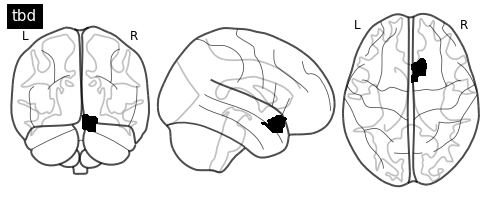

{'coords': [5.270633397312864, 35.03262955854126, -17.5278310940499], 'name': '58.54% Frontal_Medial_Cortex; 34.55% Subcallosal_Cortex', 'index_label': 3, 'data_array_index': 2}


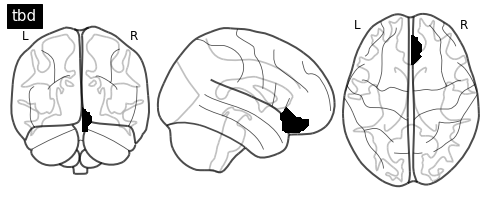

{'coords': [15.647840531561457, 34.18604651162792, -22.544850498338867], 'name': '54.15% Frontal_Pole; 41.86% Frontal_Orbital_Cortex', 'index_label': 4, 'data_array_index': 3}


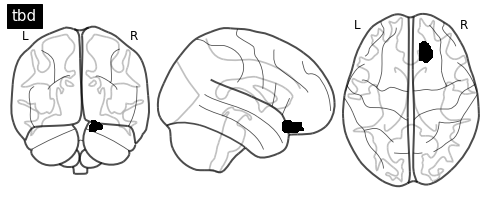

{'coords': [8.283887468030684, 46.05882352941177, -1.6700767263427139], 'name': '47.25% Paracingulate_Gyrus; 25.03% Cingulate_Gyrus_anterior_division; 16.35% Frontal_Medial_Cortex; 10.86% Frontal_Pole', 'index_label': 5, 'data_array_index': 4}


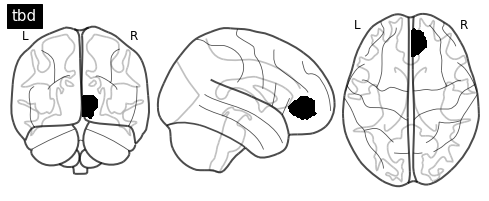

{'coords': [14.581460674157299, 64.75280898876406, 3.682584269662925], 'name': '100.00% Frontal_Pole', 'index_label': 6, 'data_array_index': 5}


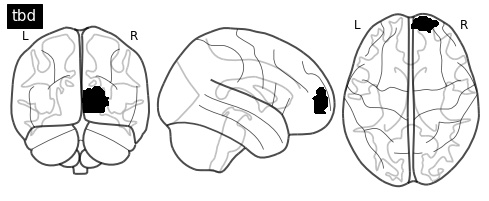

{'coords': [30.41914191419142, 54.79537953795381, -3.3267326732673297], 'name': '100.00% Frontal_Pole', 'index_label': 7, 'data_array_index': 6}


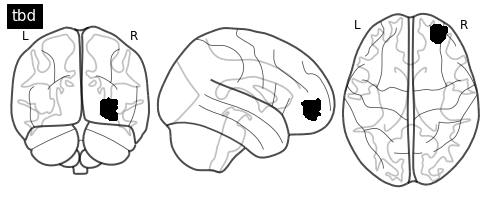

{'coords': [44.469325153374236, 46.095092024539866, -4.917177914110425], 'name': '99.85% Frontal_Pole', 'index_label': 8, 'data_array_index': 7}


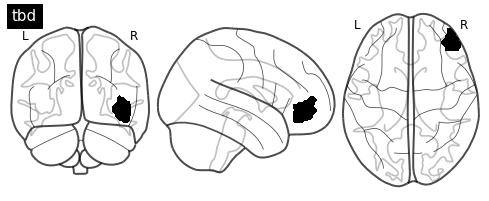

{'coords': [28.814814814814817, 51.163163163163176, 18.73473473473473], 'name': '100.00% Frontal_Pole', 'index_label': 9, 'data_array_index': 8}


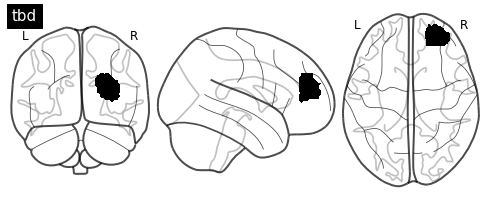

{'coords': [8.521081081081078, 53.28, 23.885405405405407], 'name': '48.54% Frontal_Pole; 32.43% Paracingulate_Gyrus; 19.03% Superior_Frontal_Gyrus', 'index_label': 10, 'data_array_index': 9}


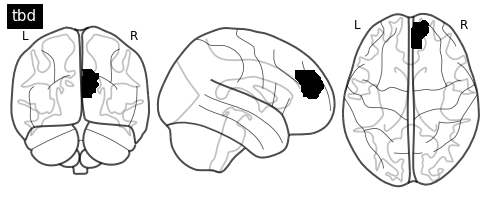

{'coords': [37.628787878787875, 35.4419191919192, 31.101010101010104], 'name': '52.15% Frontal_Pole; 47.85% Middle_Frontal_Gyrus', 'index_label': 11, 'data_array_index': 10}


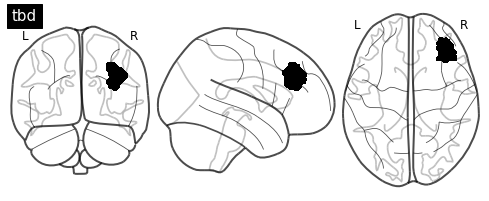

{'coords': [14.579047619047614, 36.74285714285713, 49.114285714285714], 'name': '56.57% Superior_Frontal_Gyrus; 41.14% Frontal_Pole', 'index_label': 12, 'data_array_index': 11}


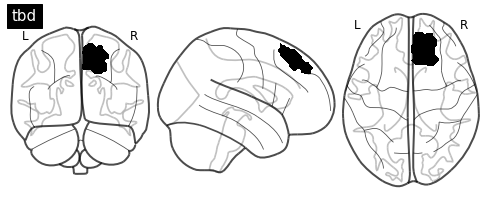

{'coords': [24.029282576866763, 30.705710102489007, 36.395314787701324], 'name': '33.82% Middle_Frontal_Gyrus; 33.82% Frontal_Pole; 26.94% Superior_Frontal_Gyrus; 5.42% no_label', 'index_label': 13, 'data_array_index': 12}


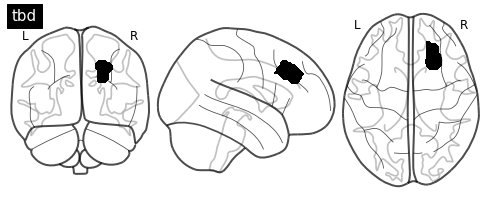

{'coords': [40.58902275769746, 14.586345381526115, 48.28112449799197], 'name': '98.80% Middle_Frontal_Gyrus', 'index_label': 14, 'data_array_index': 13}


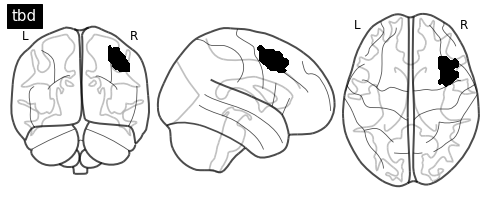

{'coords': [6.80707395498392, 21.446945337620576, 31.40836012861736], 'name': '58.36% Cingulate_Gyrus_anterior_division; 41.00% Paracingulate_Gyrus', 'index_label': 15, 'data_array_index': 14}


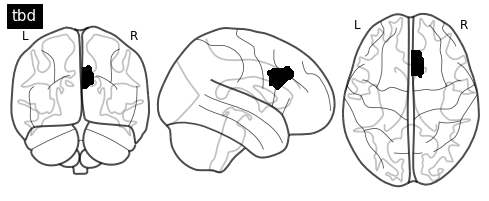

{'coords': [53.604651162790695, 24.84566596194503, 0.9048625792811862], 'name': '42.87% Inferior_Frontal_Gyrus_pars_triangularis; 25.98% Inferior_Frontal_Gyrus_pars_opercularis; 12.25% Frontal_Orbital_Cortex; 10.24% Frontal_Pole; 6.02% Frontal_Operculum_Cortex', 'index_label': 16, 'data_array_index': 15}


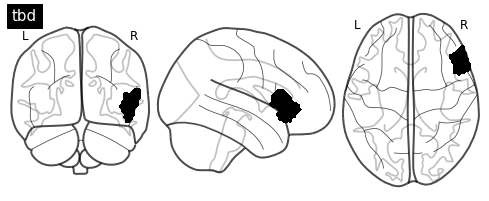

{'coords': [33.420903954802256, 37.282485875706215, -16.39265536723164], 'name': '66.67% Frontal_Pole; 32.63% Frontal_Orbital_Cortex', 'index_label': 17, 'data_array_index': 16}


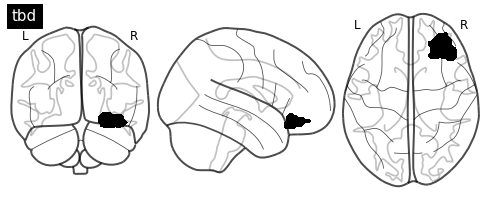

{'coords': [26.56038647342995, 19.54589371980677, -21.31884057971014], 'name': '89.61% Frontal_Orbital_Cortex; 7.97% Temporal_Pole', 'index_label': 18, 'data_array_index': 17}


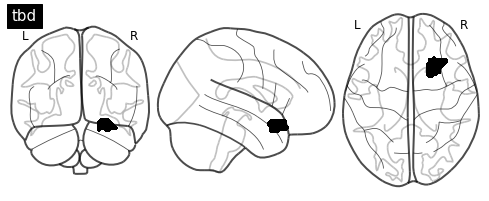

{'coords': [48.17358490566038, 35.806289308176105, 15.182389937106919], 'name': '56.48% Frontal_Pole; 27.04% Inferior_Frontal_Gyrus_pars_triangularis; 14.09% Middle_Frontal_Gyrus', 'index_label': 19, 'data_array_index': 18}


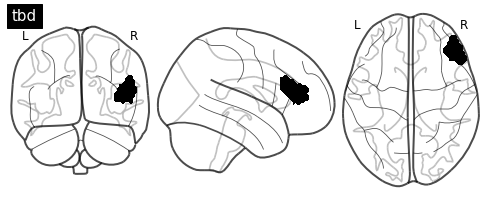

{'coords': [37.05285412262157, 20.799154334038064, 6.0], 'name': '43.55% Frontal_Operculum_Cortex; 33.40% Insular_Cortex; 10.36% Inferior_Frontal_Gyrus_pars_triangularis; 6.98% Frontal_Orbital_Cortex; 5.71% Inferior_Frontal_Gyrus_pars_opercularis', 'index_label': 20, 'data_array_index': 19}


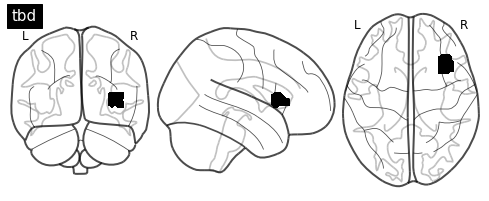

{'coords': [55.34160090191657, 9.60315670800452, 22.047350620067647], 'name': '63.51% Precentral_Gyrus; 33.67% Inferior_Frontal_Gyrus_pars_opercularis', 'index_label': 21, 'data_array_index': 20}


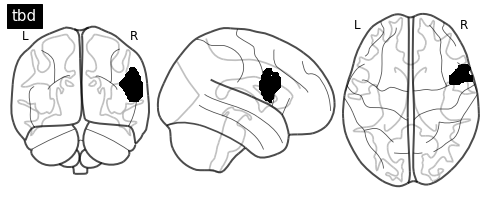

{'coords': [39.93448275862069, 17.64827586206897, 29.113793103448273], 'name': '76.55% Middle_Frontal_Gyrus; 21.03% Inferior_Frontal_Gyrus_pars_opercularis', 'index_label': 22, 'data_array_index': 21}


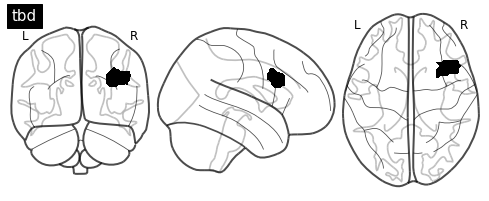

{'coords': [57.759139784946235, -8.172043010752688, 27.18064516129033], 'name': '59.68% Postcentral_Gyrus; 36.99% Precentral_Gyrus', 'index_label': 23, 'data_array_index': 22}


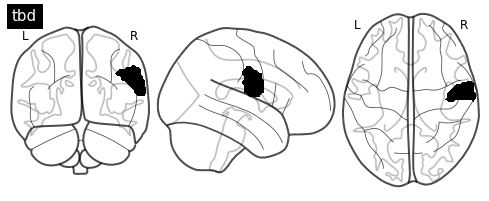

{'coords': [6.153271028037381, -22.17570093457944, 65.56635514018691], 'name': '75.89% Precentral_Gyrus; 11.78% Postcentral_Gyrus; 8.22% Juxtapositional_Lobule_Cortex_(formerly_Supplementary_Motor_Cortex)', 'index_label': 24, 'data_array_index': 23}


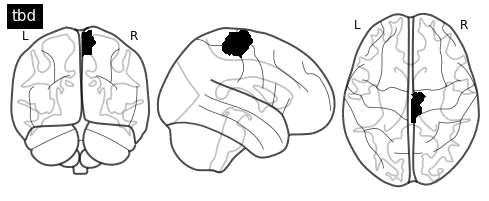

{'coords': [6.99549549549549, -8.031531531531527, 53.01801801801801], 'name': '76.80% Juxtapositional_Lobule_Cortex_(formerly_Supplementary_Motor_Cortex); 13.96% Precentral_Gyrus; 9.01% Cingulate_Gyrus_anterior_division', 'index_label': 25, 'data_array_index': 24}


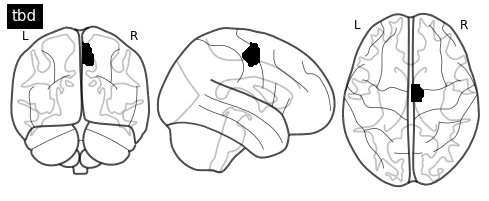

{'coords': [26.364137931034485, -12.982068965517243, 66.19034482758622], 'name': '75.10% Precentral_Gyrus; 24.62% Superior_Frontal_Gyrus', 'index_label': 26, 'data_array_index': 25}


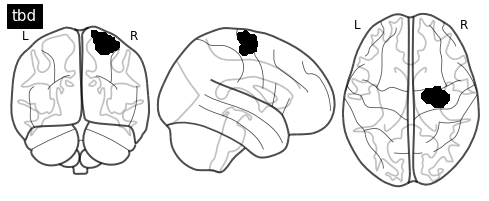

{'coords': [49.23460898502496, -4.465890183028279, 47.973377703826955], 'name': '90.05% Precentral_Gyrus; 7.30% Postcentral_Gyrus', 'index_label': 27, 'data_array_index': 26}


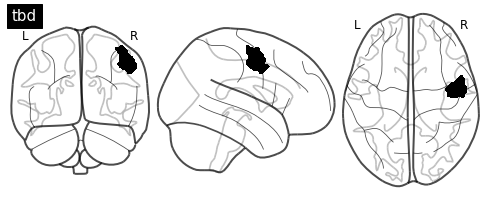

{'coords': [6.261603375527429, 14.008438818565395, 48.63713080168776], 'name': '41.56% Paracingulate_Gyrus; 27.43% Superior_Frontal_Gyrus; 21.52% Juxtapositional_Lobule_Cortex_(formerly_Supplementary_Motor_Cortex); 9.49% Cingulate_Gyrus_anterior_division', 'index_label': 28, 'data_array_index': 27}


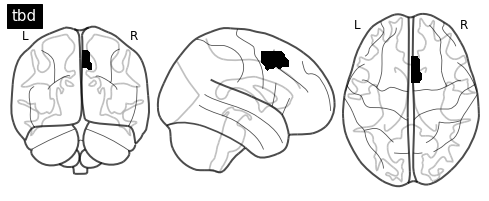

{'coords': [13.767184035476717, 6.3592017738359345, 65.3968957871397], 'name': '80.29% Superior_Frontal_Gyrus; 18.49% Juxtapositional_Lobule_Cortex_(formerly_Supplementary_Motor_Cortex)', 'index_label': 29, 'data_array_index': 28}


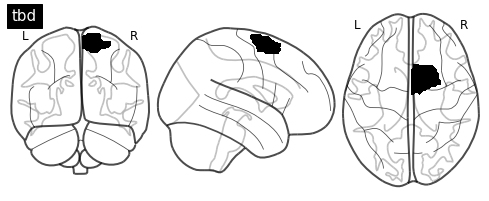

{'coords': [25.250420168067222, 12.386554621848745, 49.41176470588235], 'name': '53.27% Superior_Frontal_Gyrus; 44.39% Middle_Frontal_Gyrus', 'index_label': 30, 'data_array_index': 29}


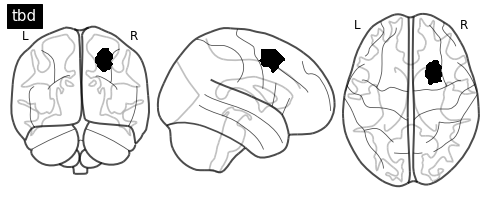

{'coords': [39.824074074074076, 3.4768518518518476, 34.074074074074076], 'name': '75.69% Precentral_Gyrus; 20.60% Middle_Frontal_Gyrus', 'index_label': 31, 'data_array_index': 30}


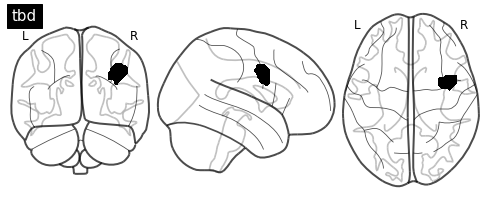

{'coords': [32.165853658536584, -5.317073170731703, 51.83902439024391], 'name': '59.27% Precentral_Gyrus; 25.61% Middle_Frontal_Gyrus; 15.12% Superior_Frontal_Gyrus', 'index_label': 32, 'data_array_index': 31}


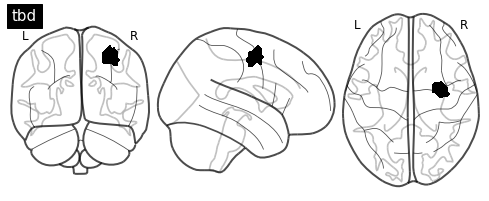

{'coords': [41.990621336459554, -23.087924970691674, 53.36694021101994], 'name': '79.75% Postcentral_Gyrus; 20.25% Precentral_Gyrus', 'index_label': 33, 'data_array_index': 32}


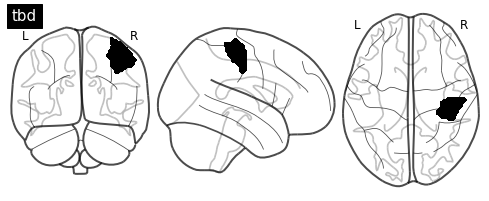

{'coords': [41.78308026030369, 4.876355748373101, -7.52711496746204], 'name': '72.35% Insular_Cortex; 17.49% Planum_Polare', 'index_label': 34, 'data_array_index': 33}


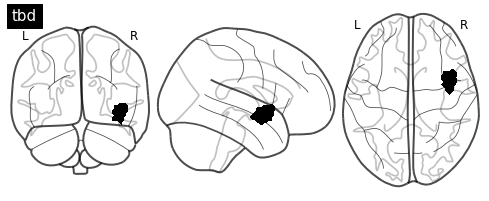

{'coords': [41.34204793028322, 3.5206971677559977, 7.259259259259267], 'name': '46.52% Central_Opercular_Cortex; 42.61% Insular_Cortex; 6.96% Frontal_Operculum_Cortex', 'index_label': 35, 'data_array_index': 34}


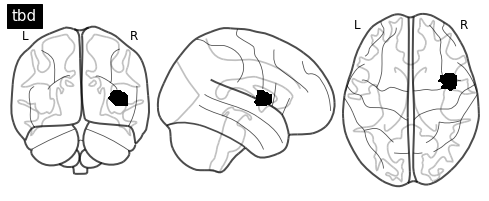

{'coords': [37.633204633204635, 21.21235521235522, -10.065637065637063], 'name': '60.69% Frontal_Orbital_Cortex; 31.21% Insular_Cortex; 6.36% Temporal_Pole', 'index_label': 36, 'data_array_index': 35}


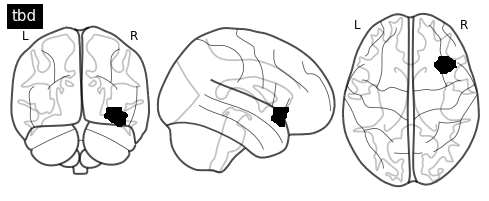

{'coords': [38.19251336898396, -12.356506238859183, -1.194295900178247], 'name': "43.19% Insular_Cortex; 26.90% Right_Putamen; 17.88% Planum_Polare; 11.15% Heschl's_Gyrus_(includes_H1_and_H2)", 'index_label': 37, 'data_array_index': 36}


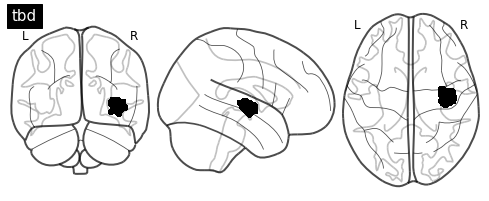

{'coords': [32.537953795379536, -39.12541254125412, 49.53135313531354], 'name': '57.66% Superior_Parietal_Lobule; 36.57% Postcentral_Gyrus', 'index_label': 38, 'data_array_index': 37}


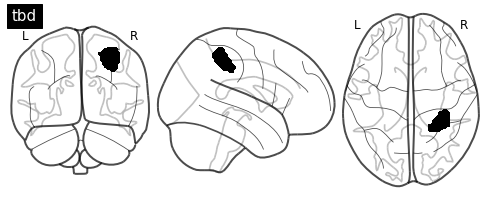

{'coords': [20.11057692307692, -33.21153846153847, 69.65625], 'name': '69.21% Postcentral_Gyrus; 25.06% Precentral_Gyrus; 5.61% Superior_Parietal_Lobule', 'index_label': 39, 'data_array_index': 38}


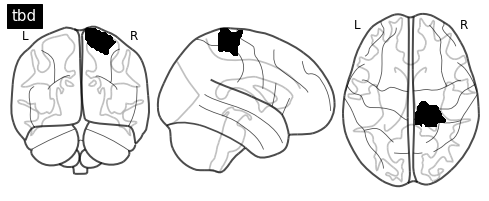

{'coords': [43.30833333333334, -10.866666666666674, 13.833333333333329], 'name': "62.08% Central_Opercular_Cortex; 30.21% Insular_Cortex; 6.46% Heschl's_Gyrus_(includes_H1_and_H2)", 'index_label': 40, 'data_array_index': 39}


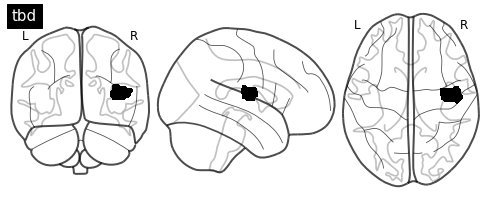

{'coords': [24.08333333333333, -53.78888888888889, 67.99444444444444], 'name': '62.20% Superior_Parietal_Lobule; 27.99% Lateral_Occipital_Cortex_superior_division; 8.37% Postcentral_Gyrus', 'index_label': 41, 'data_array_index': 40}


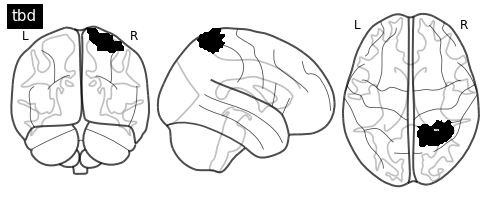

{'coords': [14.652406417112303, -68.44919786096257, 34.998217468805706], 'name': '80.25% Precuneous_Cortex; 11.39% Cuneal_Cortex; 8.19% Lateral_Occipital_Cortex_superior_division', 'index_label': 42, 'data_array_index': 41}


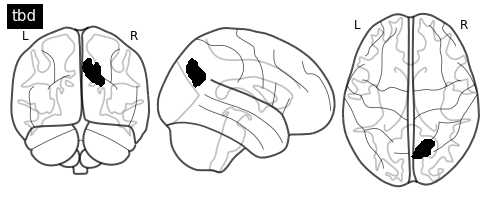

{'coords': [31.57938144329897, -60.73539518900344, 49.282474226804126], 'name': '65.82% Lateral_Occipital_Cortex_superior_division; 19.42% Superior_Parietal_Lobule; 11.12% Angular_Gyrus', 'index_label': 43, 'data_array_index': 42}


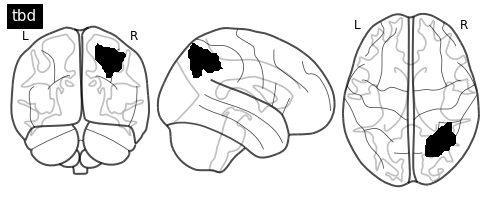

{'coords': [7.567999999999998, -57.274, 61.77600000000001], 'name': '62.64% Precuneous_Cortex; 21.68% Lateral_Occipital_Cortex_superior_division; 13.29% Postcentral_Gyrus', 'index_label': 44, 'data_array_index': 43}


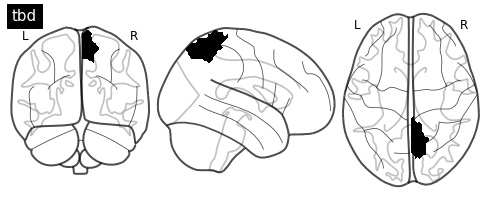

{'coords': [52.94840294840295, -27.267813267813267, 40.81736281736282], 'name': '56.46% Supramarginal_Gyrus_anterior_division; 29.54% Postcentral_Gyrus; 10.47% Supramarginal_Gyrus_posterior_division', 'index_label': 45, 'data_array_index': 44}


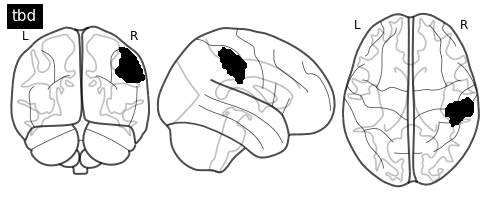

{'coords': [57.972573839662445, -29.27426160337552, 19.59071729957806], 'name': '30.14% Parietal_Operculum_Cortex; 28.13% Planum_Temporale; 14.65% Supramarginal_Gyrus_posterior_division; 13.38% Supramarginal_Gyrus_anterior_division; 7.69% Superior_Temporal_Gyrus_posterior_division', 'index_label': 46, 'data_array_index': 45}


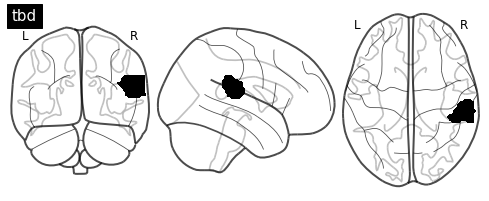

{'coords': [54.17796610169491, -45.2457627118644, 37.04237288135593], 'name': '48.64% Angular_Gyrus; 48.56% Supramarginal_Gyrus_posterior_division', 'index_label': 47, 'data_array_index': 46}


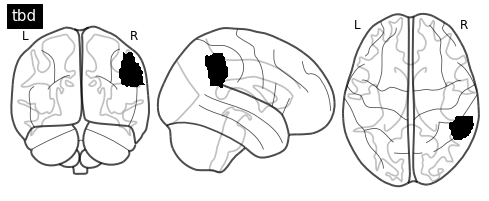

{'coords': [47.79274611398964, -61.56476683937824, 34.71295336787564], 'name': '66.63% Lateral_Occipital_Cortex_superior_division; 33.37% Angular_Gyrus', 'index_label': 48, 'data_array_index': 47}


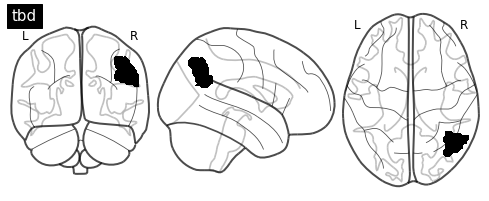

{'coords': [41.3992297817715, -75.33761232349165, 27.89473684210526], 'name': '100.00% Lateral_Occipital_Cortex_superior_division', 'index_label': 49, 'data_array_index': 48}


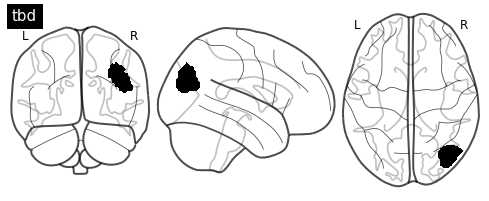

{'coords': [48.86702127659574, -58.01329787234043, 14.295212765957444], 'name': '35.64% Angular_Gyrus; 25.13% Middle_Temporal_Gyrus_temporooccipital_part; 22.21% Lateral_Occipital_Cortex_inferior_division; 16.62% Lateral_Occipital_Cortex_superior_division', 'index_label': 50, 'data_array_index': 49}


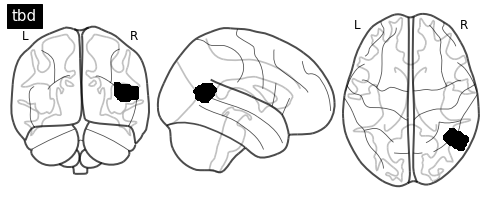

{'coords': [27.182519280205653, 11.61953727506426, -39.15167095115682], 'name': '99.23% Temporal_Pole', 'index_label': 51, 'data_array_index': 50}


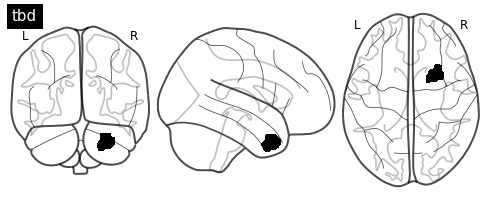

{'coords': [40.023715415019765, 18.98023715415019, -34.26086956521739], 'name': '99.80% Temporal_Pole', 'index_label': 52, 'data_array_index': 51}


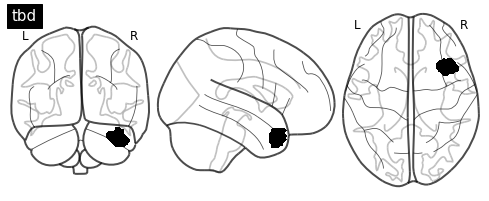

{'coords': [52.87747957992999, 10.84947491248542, -21.8343057176196], 'name': '79.58% Temporal_Pole; 11.32% Middle_Temporal_Gyrus_anterior_division; 6.53% Superior_Temporal_Gyrus_anterior_division', 'index_label': 53, 'data_array_index': 52}


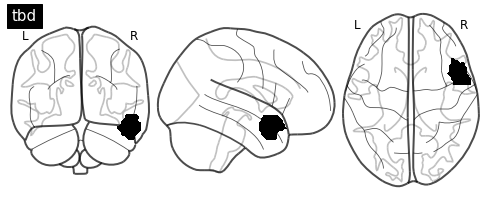

{'coords': [50.023598820059, -33.91740412979351, -0.6725663716814125], 'name': '44.25% Middle_Temporal_Gyrus_posterior_division; 31.27% Superior_Temporal_Gyrus_posterior_division; 19.17% Middle_Temporal_Gyrus_temporooccipital_part; 5.01% Supramarginal_Gyrus_posterior_division', 'index_label': 54, 'data_array_index': 53}


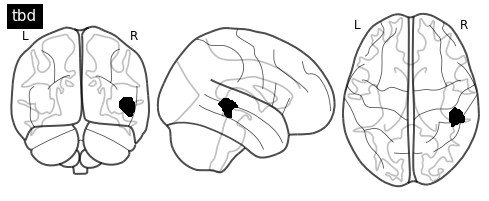

{'coords': [61.288824383164005, -22.84470246734398, -22.516690856313495], 'name': '51.45% Inferior_Temporal_Gyrus_posterior_division; 48.41% Middle_Temporal_Gyrus_posterior_division', 'index_label': 55, 'data_array_index': 54}


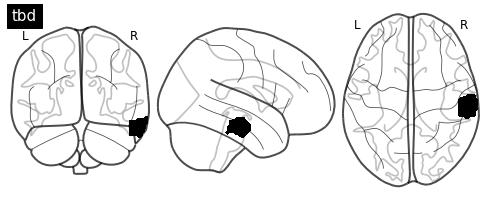

{'coords': [54.525667351129364, -7.757700205338807, -31.498973305954827], 'name': '35.86% Middle_Temporal_Gyrus_anterior_division; 35.66% Inferior_Temporal_Gyrus_posterior_division; 14.96% Inferior_Temporal_Gyrus_anterior_division; 13.52% Middle_Temporal_Gyrus_posterior_division', 'index_label': 56, 'data_array_index': 55}


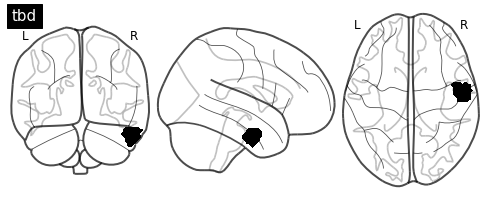

{'coords': [46.886509635974306, 3.9400428265524567, -39.87580299785867], 'name': '51.18% Temporal_Pole; 42.61% Inferior_Temporal_Gyrus_anterior_division; 5.78% Middle_Temporal_Gyrus_anterior_division', 'index_label': 57, 'data_array_index': 56}


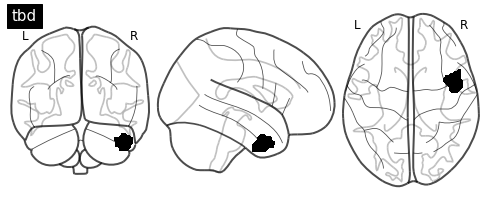

{'coords': [40.26603325415677, -11.106888361045137, -35.81472684085511], 'name': '44.89% Temporal_Fusiform_Cortex_posterior_division; 21.62% Inferior_Temporal_Gyrus_posterior_division; 15.68% Temporal_Fusiform_Cortex_anterior_division; 15.68% Inferior_Temporal_Gyrus_anterior_division', 'index_label': 58, 'data_array_index': 57}


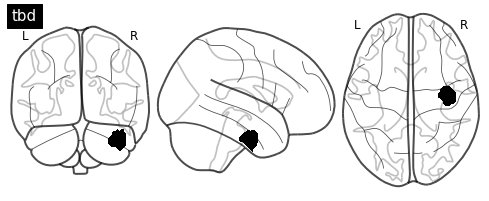

{'coords': [43.494897959183675, -26.275510204081627, -24.71938775510204], 'name': '54.08% Inferior_Temporal_Gyrus_posterior_division; 45.92% Temporal_Fusiform_Cortex_posterior_division', 'index_label': 59, 'data_array_index': 58}


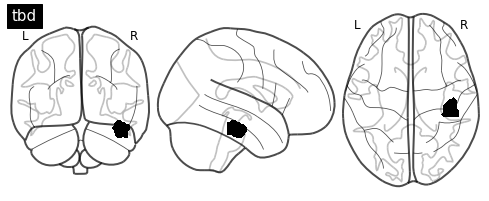

{'coords': [31.51030927835052, 0.6494845360824684, -44.41752577319588], 'name': '59.02% Temporal_Fusiform_Cortex_anterior_division; 27.58% Temporal_Pole; 11.34% Inferior_Temporal_Gyrus_anterior_division', 'index_label': 60, 'data_array_index': 59}


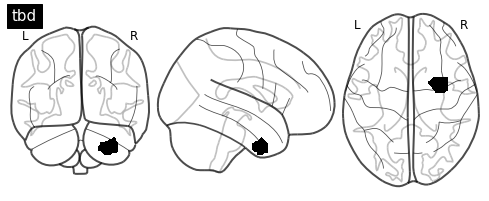

{'coords': [59.15972894482091, -3.3242981606969977, 2.6698935140367865], 'name': "24.69% Central_Opercular_Cortex; 18.49% Superior_Temporal_Gyrus_anterior_division; 10.84% Precentral_Gyrus; 10.65% Planum_Temporale; 10.16% Planum_Polare; 9.20% Heschl's_Gyrus_(includes_H1_and_H2); 8.52% Temporal_Pole; 6.00% Superior_Temporal_Gyrus_posterior_division", 'index_label': 61, 'data_array_index': 60}


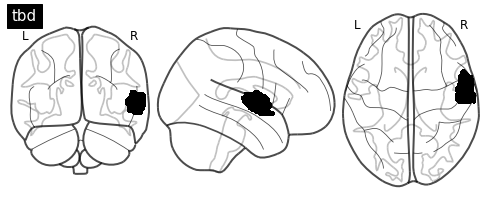

{'coords': [39.788649706457925, -25.643835616438352, 14.450097847358123], 'name': "31.31% Parietal_Operculum_Cortex; 24.07% Planum_Temporale; 21.33% Heschl's_Gyrus_(includes_H1_and_H2); 21.33% Insular_Cortex", 'index_label': 62, 'data_array_index': 61}


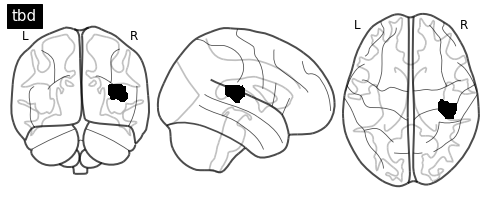

{'coords': [61.87484662576687, -23.617177914110428, -2.741104294478532], 'name': '48.90% Middle_Temporal_Gyrus_posterior_division; 46.20% Superior_Temporal_Gyrus_posterior_division', 'index_label': 63, 'data_array_index': 62}


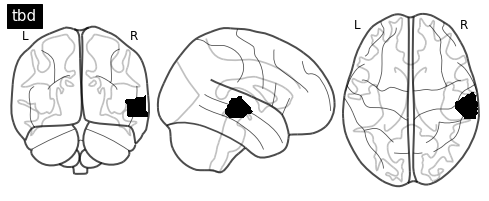

{'coords': [56.48476821192053, -8.543046357615893, -14.317880794701985], 'name': '44.52% Middle_Temporal_Gyrus_posterior_division; 21.40% Superior_Temporal_Gyrus_anterior_division; 19.42% Middle_Temporal_Gyrus_anterior_division; 7.93% Planum_Polare; 6.74% Superior_Temporal_Gyrus_posterior_division', 'index_label': 64, 'data_array_index': 63}


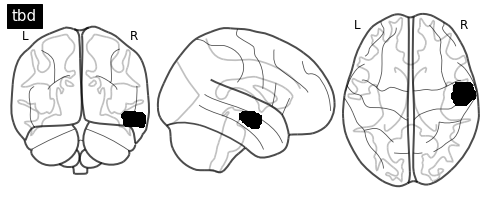

{'coords': [59.240374609781476, -43.72736732570239, 8.616024973985432], 'name': '51.09% Middle_Temporal_Gyrus_temporooccipital_part; 26.64% Supramarginal_Gyrus_posterior_division; 12.90% Angular_Gyrus; 6.04% Superior_Temporal_Gyrus_posterior_division', 'index_label': 65, 'data_array_index': 64}


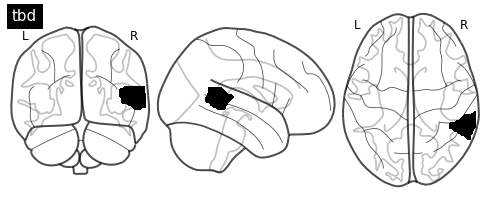

{'coords': [46.513513513513516, -59.8018018018018, -14.716216216216218], 'name': '35.14% Inferior_Temporal_Gyrus_temporooccipital_part; 29.73% Lateral_Occipital_Cortex_inferior_division; 27.48% Temporal_Occipital_Fusiform_Cortex; 7.66% Occipital_Fusiform_Gyrus', 'index_label': 66, 'data_array_index': 65}


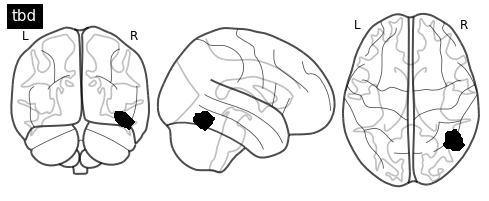

{'coords': [36.57192374350087, -69.2790294627383, -17.4419410745234], 'name': '54.07% Occipital_Fusiform_Gyrus; 28.60% Lateral_Occipital_Cortex_inferior_division; 14.90% Temporal_Occipital_Fusiform_Cortex', 'index_label': 67, 'data_array_index': 66}


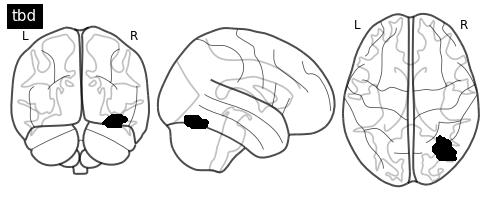

{'coords': [25.14009661835749, -44.547504025764894, -12.193236714975846], 'name': '45.02% Lingual_Gyrus; 42.60% Temporal_Occipital_Fusiform_Cortex; 6.43% Parahippocampal_Gyrus_posterior_division; 5.63% Temporal_Fusiform_Cortex_posterior_division', 'index_label': 68, 'data_array_index': 67}


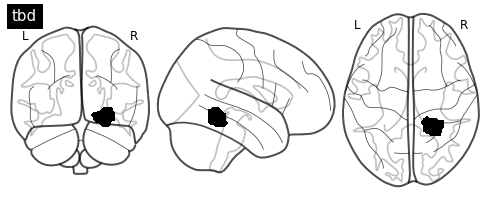

{'coords': [55.26453488372093, -56.28197674418604, -4.79651162790698], 'name': '48.69% Middle_Temporal_Gyrus_temporooccipital_part; 29.07% Lateral_Occipital_Cortex_inferior_division; 22.09% Inferior_Temporal_Gyrus_temporooccipital_part', 'index_label': 69, 'data_array_index': 68}


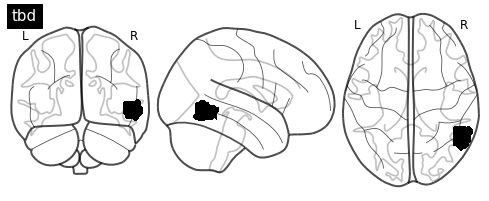

{'coords': [60.80082135523614, -43.37577002053388, -17.652977412731005], 'name': '54.11% Inferior_Temporal_Gyrus_temporooccipital_part; 17.25% Middle_Temporal_Gyrus_temporooccipital_part; 14.99% Middle_Temporal_Gyrus_posterior_division; 13.55% Inferior_Temporal_Gyrus_posterior_division', 'index_label': 70, 'data_array_index': 69}


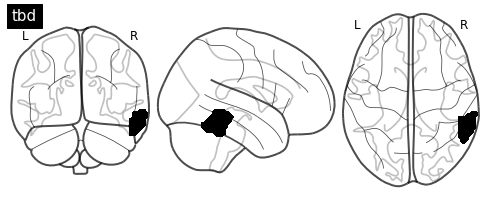

{'coords': [41.678688524590164, -45.652459016393436, -22.583606557377053], 'name': '65.90% Temporal_Occipital_Fusiform_Cortex; 17.05% Inferior_Temporal_Gyrus_temporooccipital_part; 9.84% Temporal_Fusiform_Cortex_posterior_division', 'index_label': 71, 'data_array_index': 70}


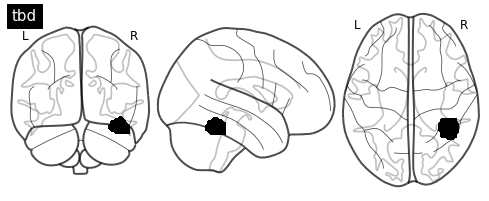

{'coords': [20.99842022116904, -63.60189573459716, -9.011058451816744], 'name': '59.84% Lingual_Gyrus; 28.82% Occipital_Fusiform_Gyrus; 11.34% Temporal_Occipital_Fusiform_Cortex', 'index_label': 72, 'data_array_index': 71}


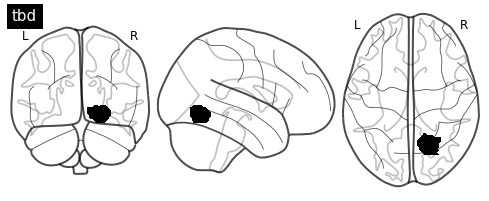

{'coords': [30.108974358974358, -83.00641025641025, 20.467948717948715], 'name': '76.60% Lateral_Occipital_Cortex_superior_division; 17.79% Occipital_Pole; 5.61% Lateral_Occipital_Cortex_inferior_division', 'index_label': 73, 'data_array_index': 72}


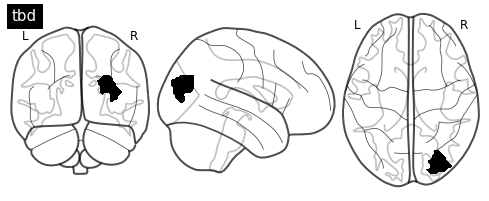

{'coords': [45.1231884057971, -74.23913043478261, 2.6062801932367137], 'name': '95.78% Lateral_Occipital_Cortex_inferior_division', 'index_label': 74, 'data_array_index': 73}


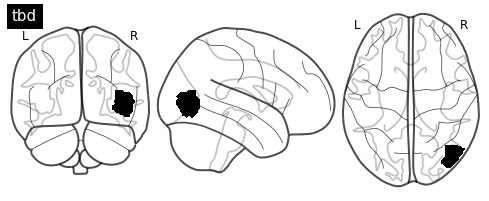

{'coords': [18.95423340961098, -81.837528604119, 41.53775743707094], 'name': '68.88% Lateral_Occipital_Cortex_superior_division; 17.39% Occipital_Pole; 7.09% Cuneal_Cortex; 6.64% Precuneous_Cortex', 'index_label': 75, 'data_array_index': 74}


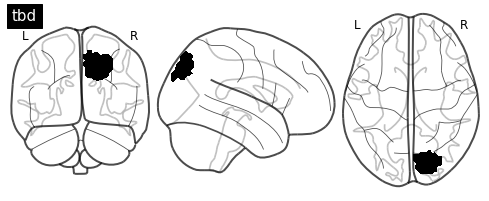

{'coords': [18.03679369250986, -83.38764783180027, -11.250985545335084], 'name': '60.71% Occipital_Fusiform_Gyrus; 21.94% Lingual_Gyrus; 17.21% Occipital_Pole', 'index_label': 76, 'data_array_index': 75}


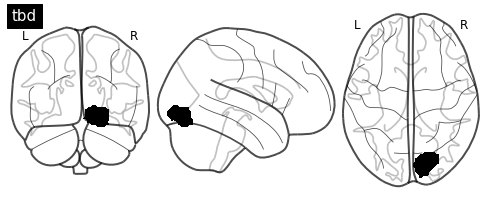

{'coords': [8.030769230769238, -74.83461538461538, 24.761538461538464], 'name': '70.63% Cuneal_Cortex; 15.55% Precuneous_Cortex; 7.49% Intracalcarine_Cortex; 6.33% Supracalcarine_Cortex', 'index_label': 77, 'data_array_index': 76}


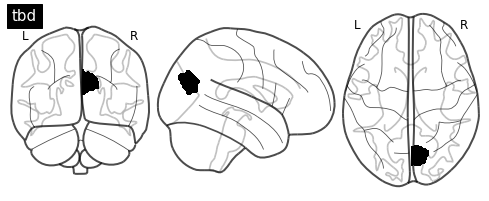

{'coords': [23.661360347322727, -95.88422575976846, 6.633863965267722], 'name': '93.49% Occipital_Pole; 6.22% Lateral_Occipital_Cortex_inferior_division', 'index_label': 78, 'data_array_index': 77}


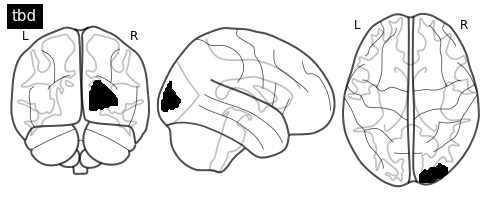

{'coords': [7.193058568329718, -75.54446854663775, -2.8242950108459866], 'name': '87.45% Lingual_Gyrus; 12.34% Intracalcarine_Cortex', 'index_label': 79, 'data_array_index': 78}


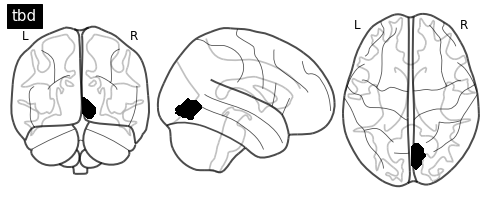

{'coords': [8.33620689655173, -88.44827586206897, 12.166666666666671], 'name': '52.87% Occipital_Pole; 27.87% Intracalcarine_Cortex; 10.49% Cuneal_Cortex; 7.61% Supracalcarine_Cortex', 'index_label': 80, 'data_array_index': 79}


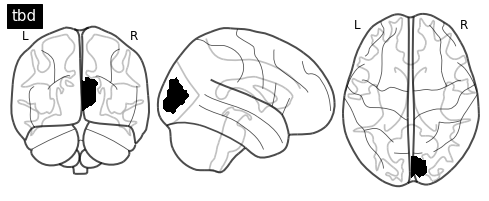

{'coords': [30.998459167950692, -91.90446841294299, -10.795069337442214], 'name': '55.16% Occipital_Pole; 38.06% Lateral_Occipital_Cortex_inferior_division; 6.78% Occipital_Fusiform_Gyrus', 'index_label': 81, 'data_array_index': 80}


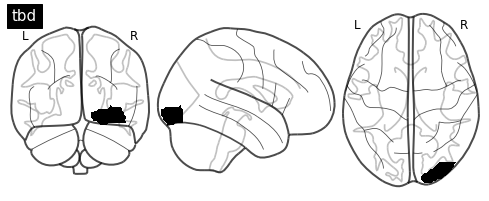

{'coords': [14.878274268104775, -68.41294298921417, 8.289676425269647], 'name': '79.23% Intracalcarine_Cortex; 14.00% Lingual_Gyrus', 'index_label': 82, 'data_array_index': 81}


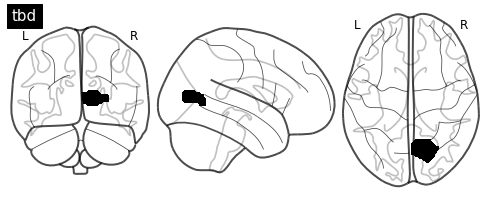

{'coords': [8.041666666666671, 34.71180555555554, 17.19791666666667], 'name': '72.92% Cingulate_Gyrus_anterior_division; 26.74% Paracingulate_Gyrus', 'index_label': 83, 'data_array_index': 82}


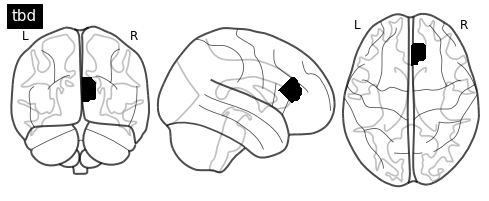

{'coords': [5.53591160220995, -0.8895027624309364, 35.51933701657458], 'name': '99.45% Cingulate_Gyrus_anterior_division', 'index_label': 84, 'data_array_index': 83}


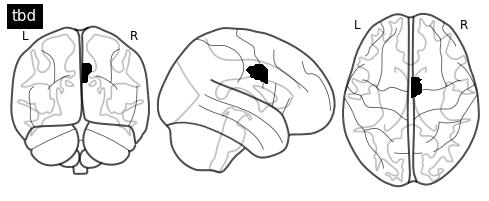

{'coords': [5.35532994923858, -39.10659898477158, 26.89340101522842], 'name': '98.98% Cingulate_Gyrus_posterior_division', 'index_label': 85, 'data_array_index': 84}


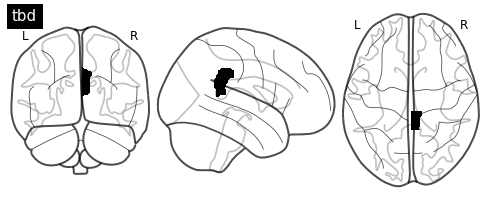

{'coords': [12.366612111292966, -57.198036006546644, 18.00654664484452], 'name': '85.29% Precuneous_Cortex; 6.70% Cingulate_Gyrus_posterior_division', 'index_label': 86, 'data_array_index': 85}


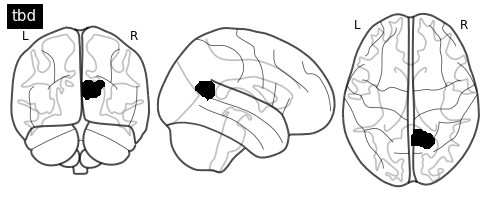

{'coords': [28.404411764705884, -53.897058823529406, 6.977941176470594], 'name': '49.82% Right_Lateral_Ventricle; 19.78% Precuneous_Cortex; 17.22% Lingual_Gyrus; 11.72% Intracalcarine_Cortex', 'index_label': 87, 'data_array_index': 86}


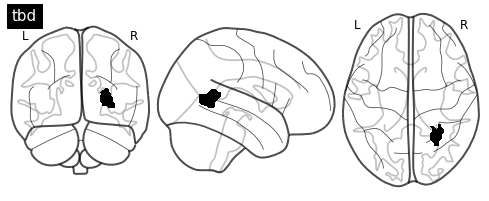

{'coords': [7.312741312741309, -18.888030888030883, 30.00772200772201], 'name': '53.67% Cingulate_Gyrus_posterior_division; 25.48% Right_Lateral_Ventricle; 13.13% Cingulate_Gyrus_anterior_division; 7.72% no_label', 'index_label': 88, 'data_array_index': 87}


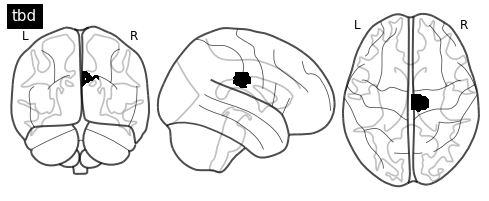

{'coords': [8.047619047619051, -22.923809523809524, 44.99047619047619], 'name': '47.38% Precentral_Gyrus; 46.19% Cingulate_Gyrus_posterior_division; 5.24% Cingulate_Gyrus_anterior_division', 'index_label': 89, 'data_array_index': 88}


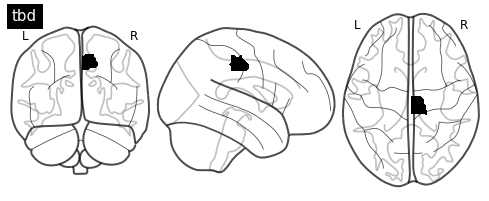

{'coords': [6.3299270072992755, -57.185401459854006, 38.08759124087591], 'name': '83.65% Precuneous_Cortex; 16.35% Cingulate_Gyrus_posterior_division', 'index_label': 90, 'data_array_index': 89}


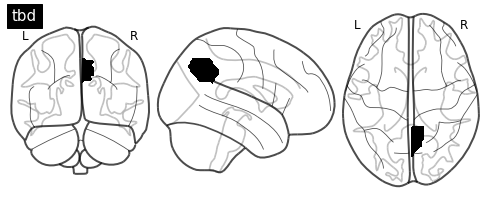

{'coords': [8.377981651376146, -39.77981651376146, 48.10275229357798], 'name': '53.21% Precuneous_Cortex; 25.50% Cingulate_Gyrus_posterior_division; 15.05% Postcentral_Gyrus; 6.24% Precentral_Gyrus', 'index_label': 91, 'data_array_index': 90}


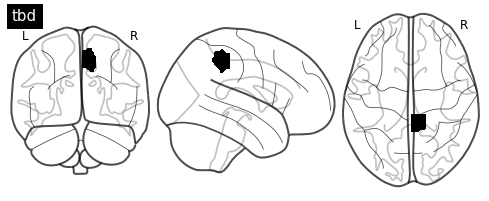

{'coords': [31.232505643340858, 3.670428893905182, -21.733634311512418], 'name': '40.77% Right_Amygdala; 36.94% Temporal_Pole; 9.46% Insular_Cortex', 'index_label': 92, 'data_array_index': 91}


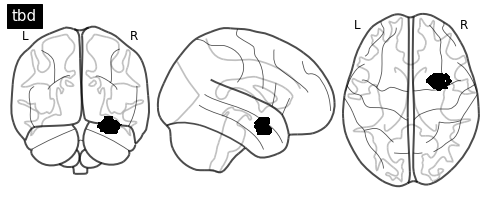

{'coords': [28.74850299401197, -36.8562874251497, -0.10179640718563121], 'name': '50.90% Right_Hippocampus; 31.44% Right_Lateral_Ventricle; 7.49% Right_Thalamus; 7.49% Lingual_Gyrus', 'index_label': 93, 'data_array_index': 92}


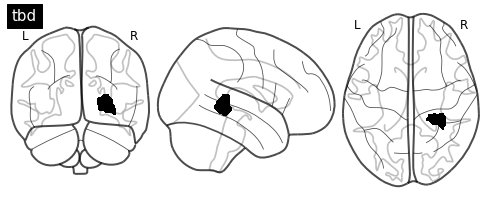

{'coords': [35.63389830508474, -14.69152542372882, -18.427118644067797], 'name': '64.75% Right_Hippocampus; 20.00% Temporal_Fusiform_Cortex_posterior_division', 'index_label': 94, 'data_array_index': 93}


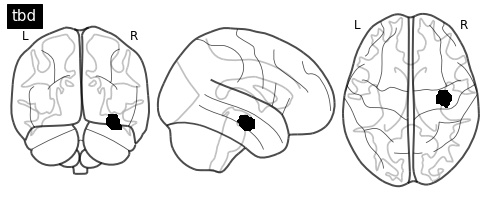

{'coords': [28.017921146953405, -28.480286738351253, -13.666666666666664], 'name': '48.75% Right_Hippocampus; 37.63% Parahippocampal_Gyrus_posterior_division; 11.47% Temporal_Fusiform_Cortex_posterior_division', 'index_label': 95, 'data_array_index': 94}


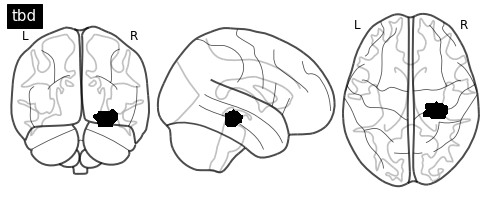

{'coords': [29.340659340659343, -19.65384615384616, -26.36813186813187], 'name': '36.26% Parahippocampal_Gyrus_anterior_division; 26.92% Temporal_Fusiform_Cortex_posterior_division; 22.53% Right_Hippocampus; 14.29% Parahippocampal_Gyrus_posterior_division', 'index_label': 96, 'data_array_index': 95}


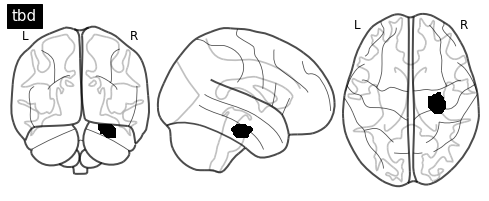

{'coords': [24.57294429708223, -2.6259946949602124, -30.737400530503976], 'name': '62.60% Parahippocampal_Gyrus_anterior_division; 13.26% Right_Hippocampus; 9.81% Right_Amygdala; 7.16% Temporal_Pole; 6.10% Temporal_Fusiform_Cortex_anterior_division', 'index_label': 97, 'data_array_index': 96}


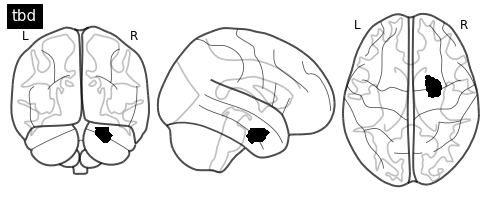

{'coords': [14.620031796502388, -46.13990461049285, 2.8044515103338625], 'name': '37.08% Cingulate_Gyrus_posterior_division; 35.50% Lingual_Gyrus; 12.20% Precuneous_Cortex; 6.66% Right_Lateral_Ventricle; 5.86% Right_Hippocampus', 'index_label': 98, 'data_array_index': 97}


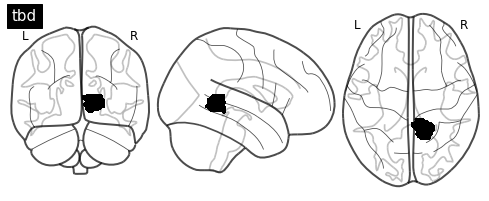

{'coords': [19.216129032258067, -7.6419354838709666, -14.835483870967742], 'name': '46.70% Right_Amygdala; 27.05% Right_Hippocampus; 12.88% no_label; 7.41% Right_Putamen', 'index_label': 99, 'data_array_index': 98}


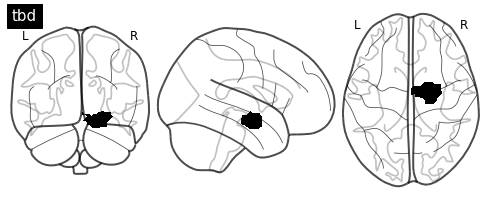

{'coords': [32.22514619883041, -78.47368421052632, -40.41228070175438], 'name': '100.00% no_label', 'index_label': 100, 'data_array_index': 99}


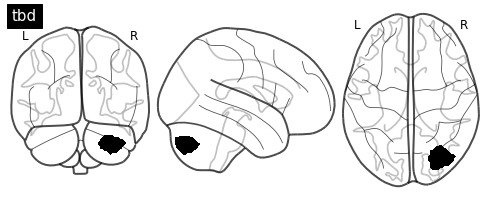

{'coords': [6.489533011272144, -50.61191626409018, -12.18035426731079], 'name': '53.46% no_label; 29.63% Lingual_Gyrus; 16.59% Brain-Stem', 'index_label': 101, 'data_array_index': 100}


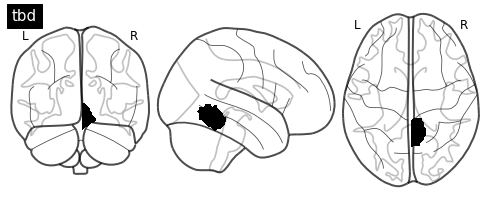

{'coords': [38.87318087318087, -74.9106029106029, -29.59043659043659], 'name': '55.82% no_label; 30.46% Lateral_Occipital_Cortex_inferior_division; 9.67% Occipital_Fusiform_Gyrus', 'index_label': 102, 'data_array_index': 101}


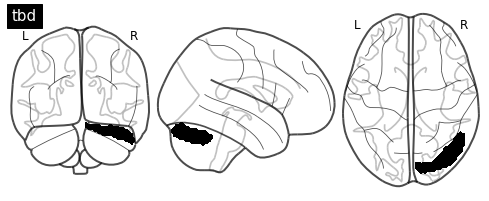

{'coords': [13.590909090909093, -40.10909090909091, -25.304545454545455], 'name': '52.04% Brain-Stem; 38.91% no_label; 6.33% Parahippocampal_Gyrus_posterior_division', 'index_label': 103, 'data_array_index': 102}


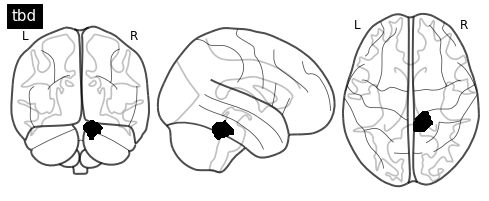

{'coords': [23.47572815533981, -35.990291262135926, -42.9126213592233], 'name': '61.35% no_label; 38.65% Brain-Stem', 'index_label': 104, 'data_array_index': 103}


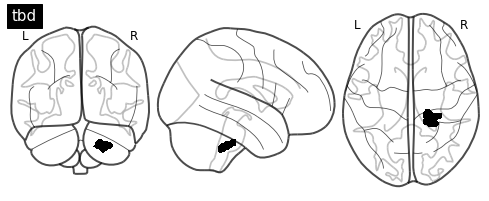

{'coords': [7.170454545454547, -68.14204545454545, -37.65340909090909], 'name': '100.00% no_label', 'index_label': 105, 'data_array_index': 104}


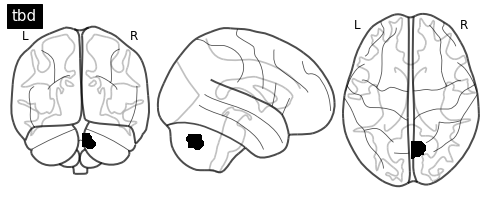

{'coords': [7.478260869565219, -68.80745341614906, -20.82815734989648], 'name': '61.90% no_label; 29.19% Lingual_Gyrus; 8.90% Occipital_Fusiform_Gyrus', 'index_label': 106, 'data_array_index': 105}


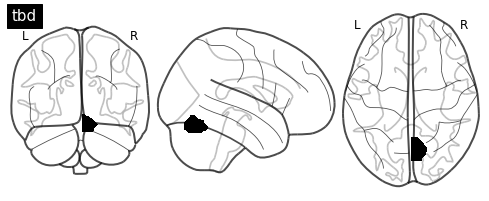

{'coords': [45.83622047244094, -46.37165354330709, -42.52913385826771], 'name': '97.80% no_label', 'index_label': 107, 'data_array_index': 106}


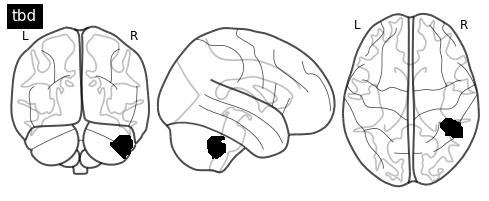

{'coords': [16.186274509803923, -47.28431372549019, -52.55882352941177], 'name': '73.28% no_label; 26.72% Brain-Stem', 'index_label': 108, 'data_array_index': 107}


KeyboardInterrupt: 

In [60]:
from nilearn.image import new_img_like

shen_pauli_aan_dict = np.load('../data//02_rois_masks_maps/shen_pauli_aan_dict.npy', allow_pickle=True).item()

key_regions         = np.arange(1,294)

key_regions_label   = ['tbd'] * len(key_regions) 
colorlist           = ['black' ] * len(key_regions) 

for count in range(len(key_regions)):#3):  
    
    curr_region_dictidx = key_regions[count]
    print(shen_pauli_aan_dict[curr_region_dictidx])
    
    all_file       = '../data/02_rois_masks_maps/allcombined.nii'
    all_img        = nilearn.image.load_img(all_file)
    all_data       = all_img.get_fdata()

    all_data[np.where(all_data!= curr_region_dictidx)] = 0
    all_new_img    = new_img_like(all_img, all_data.astype(int))

    current_title  = key_regions_label[count]
    display = plotting.plot_glass_brain(None,
                                       title = current_title)
    display.add_contours(all_new_img, filled=True, colors=colorlist[count])
    plt.show()


# 
So, up to here we have shown that 

- at least nominally, ISC among twins is stronger than among non-twins.
- from first glance, it appears that this is a relatively global effect, i.e. ISC seems consistently elevated throughout the brain, not just in a single region.
- tentative interpretation: it could be a general 'attentional' effect.
- seeing the world in the same way? 


Next steps: 
- run statistics
- examine if some regions stand out
- examine e.g. if this is demonstrable for all age groups.
- examine if this could be explained e.g. by anatomical differences ...



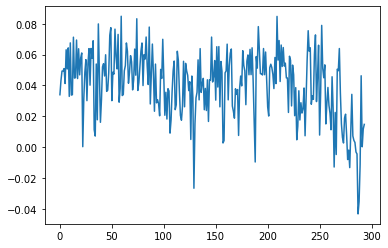

In [200]:
diffs = reg_mean_twin_iscs - reg_mean_controltwin_iscs
plt.plot(diffs);

from nilearn import input_data, datasets
all293_rois_file       = '../data/02_rois_masks_maps/allcombined.nii'
all293_masker = input_data.NiftiLabelsMasker(all293_rois_file, 
                                             detrend     = True, 
                                             standardize = True,
                                             high_pass   = 0.01, 
                                             t_r         = 0.8, 
                                             low_pass    = 0.12 );
all293_masker.fit('../data/02_rois_masks_maps/sub-0001_ses-02_task-partlycloudy_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')
brainisc = all293_masker.inverse_transform(np.reshape(diffs[:293], (1,293))) #drop last element because that's just anatomy


<Figure size 720x432 with 0 Axes>

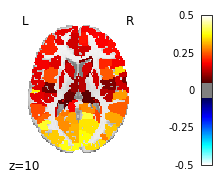

<Figure size 720x432 with 0 Axes>

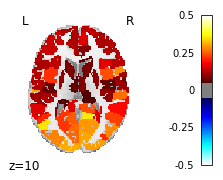

<Figure size 720x432 with 0 Axes>

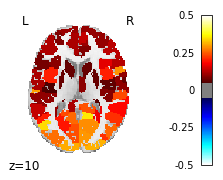

In [201]:
curr_isc = np.reshape(reg_mean_twin_iscs[:293] , (293,1)).T
curr_img = all293_masker.inverse_transform(curr_isc);

plt.figure(figsize = (10,6));
nilearn.plotting.plot_stat_map(nilearn.image.index_img(curr_img,0), 
                                   threshold    = 0.05, 
                                   vmax         = 0.5, 
                                   draw_cross   = True,
                                   display_mode = 'z',
                                   cut_coords   = [10],
                                   annotate     = True,);
plt.show();


curr_isc = np.reshape(reg_mean_controltwin_iscs[:293] , (293,1)).T
curr_img = all293_masker.inverse_transform(curr_isc);

plt.figure(figsize = (10,6));
nilearn.plotting.plot_stat_map(nilearn.image.index_img(curr_img,0), 
                                   threshold    = 0.05, 
                                   vmax         = 0.5, 
                                   draw_cross   = True,
                                   display_mode = 'z',
                                   cut_coords   = [ 10],
                                   annotate     = True,);
plt.show();


curr_isc = np.reshape(reg_mean_notwin_iscs[:293] , (293,1)).T
curr_img = all293_masker.inverse_transform(curr_isc);

plt.figure(figsize = (10,6));
nilearn.plotting.plot_stat_map(nilearn.image.index_img(curr_img,0), 
                                   threshold    = 0.05, 
                                   vmax         = 0.5, 
                                   draw_cross   = True,
                                   display_mode = 'z',
                                   cut_coords   = [ 10],
                                   annotate     = True,);
plt.show();


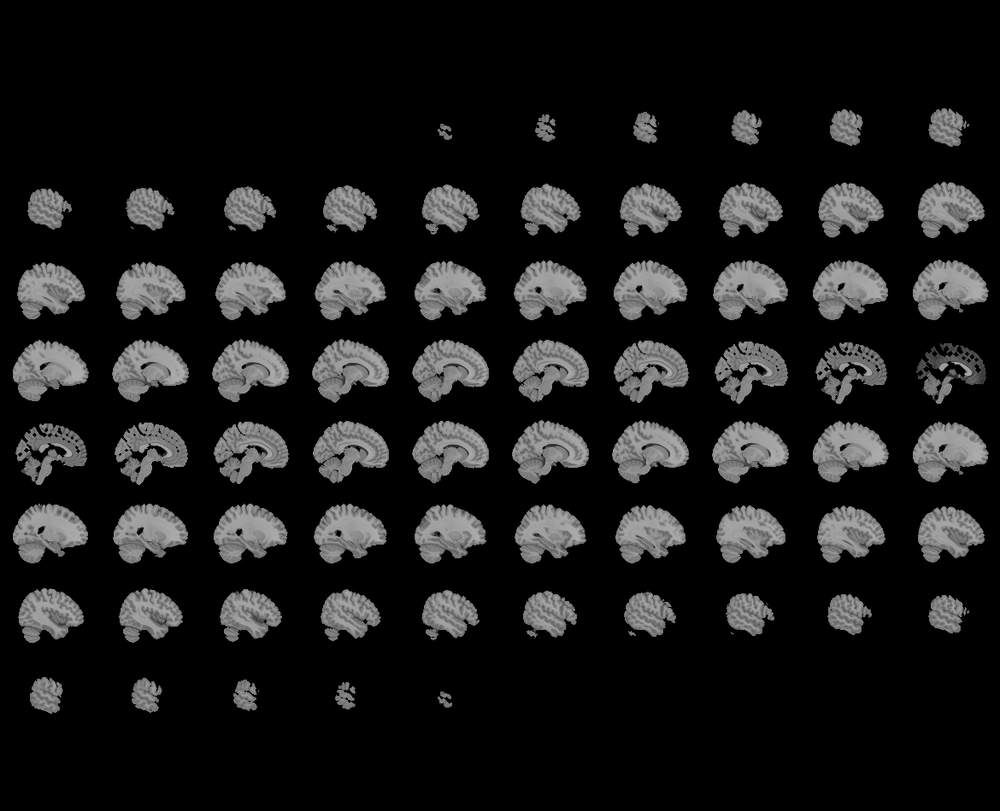
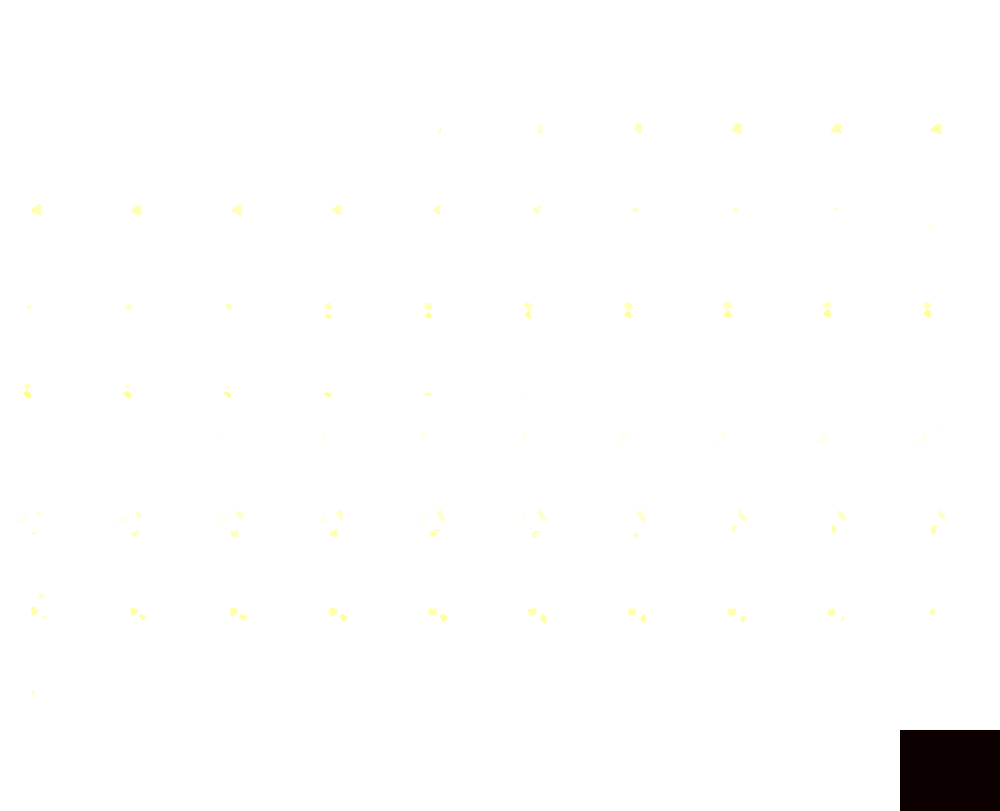

In [202]:
import nilearn.plotting
view = nilearn.plotting.view_img(brainisc, threshold = 0.075)
view

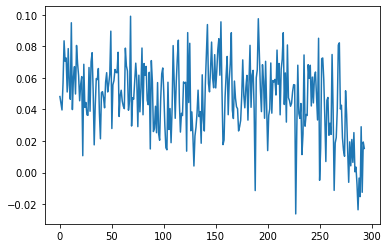

In [203]:
diffs2 = reg_mean_twin_iscs - reg_mean_notwin_iscs
plt.plot(diffs2);
brainisc2 = all293_masker.inverse_transform(np.reshape(diffs2[:293], (1,293))) #drop last element because that's just anatomy



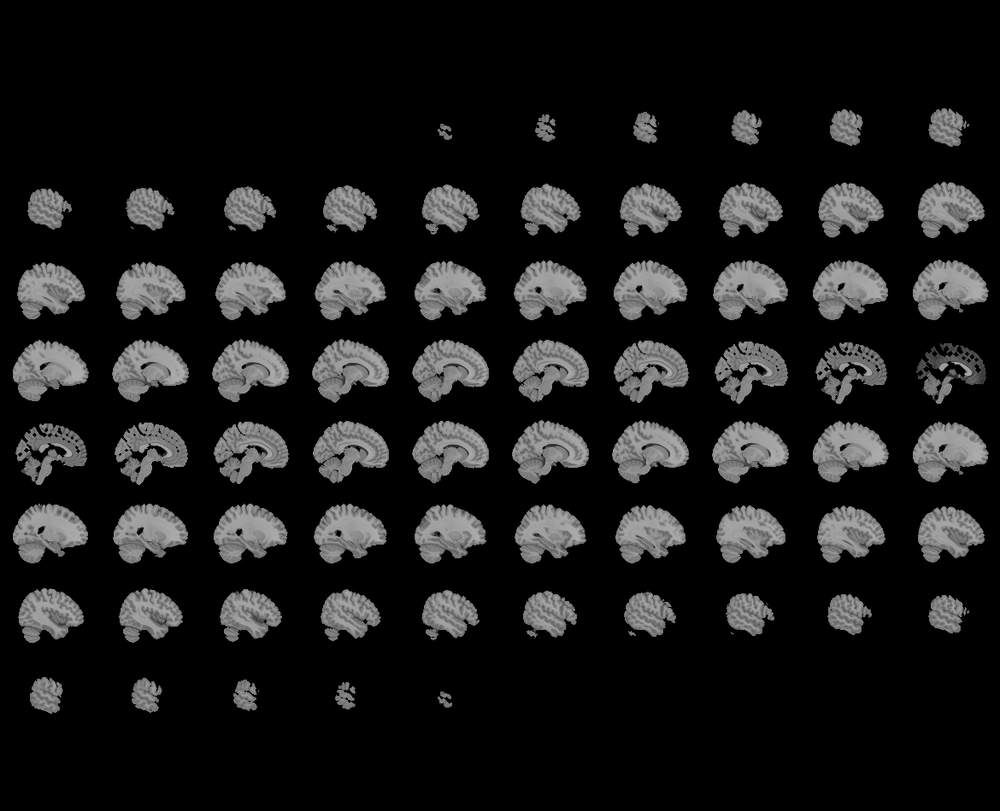
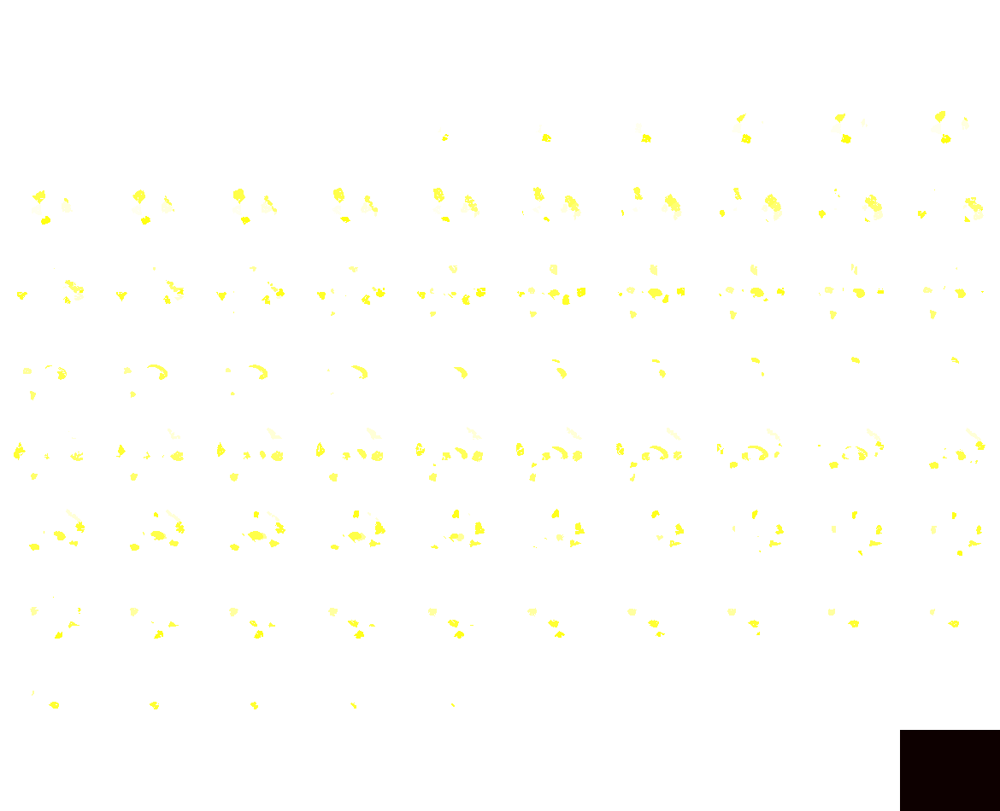

In [204]:
view = nilearn.plotting.view_img(brainisc2, threshold = 0.075)
view

In [205]:
df = pd.DataFrame([reg_mean_twin_iscs[:293], reg_mean_controltwin_iscs[:293], reg_mean_notwin_iscs[:293]]).T
df.columns = ['twin pairs', 'control pairs', 'others']
df

,twin pairs,control pairs,others
0,0.098785,0.064853,0.050586
1,0.121026,0.077913,0.076888
2,0.195469,0.146196,0.155770
3,0.088225,0.038925,0.031496
4,0.189220,0.138337,0.105649
...,...,...,...
288,0.000556,0.035886,0.004077
289,0.010104,0.021556,0.025405
290,0.043552,-0.002692,0.014495
291,-0.013512,-0.013670,-0.000965


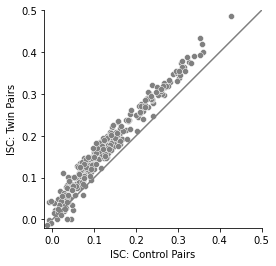

In [206]:
sns.scatterplot(df['control pairs'].values, 
            df['twin pairs'].values,
            color = 'gray')
plt.axis('square');
plt.xlim(-0.02,.5);
plt.ylim(-0.02,.5);

plt.plot([0, 1], [0, 1], color = 'gray')

plt.xticks(ticks=[0, .1, .2, .3, .4,.5])
plt.yticks(ticks=[0, .1, .2, .3 ,.4,.5])

plt.xlabel('ISC: Control Pairs')
plt.ylabel('ISC: Twin Pairs')
sns.despine()

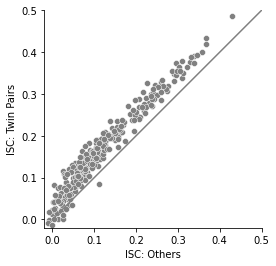

In [207]:
sns.scatterplot(df['others'].values, 
            df['twin pairs'].values,
            color = 'gray')
plt.axis('square');
plt.xlim(-0.02,.5);
plt.ylim(-0.02,.5);

plt.plot([0, 1], [0, 1], color = 'gray')

plt.xticks(ticks=[0, .1, .2, .3, .4,.5])
plt.yticks(ticks=[0, .1, .2, .3 ,.4,.5])

plt.xlabel('ISC: Others')
plt.ylabel('ISC: Twin Pairs')
sns.despine()

<Axes: >

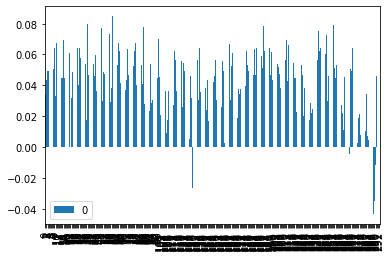

In [56]:
df1 =  pd.DataFrame(df['twins'] - df['control_twins'])
df1.plot(kind="bar")

### Stats testing

In [208]:
results_dictionary['isc_reg_twin'].shape



(294, 100)

In [209]:
results_dictionary['isc_reg_controltwin'].shape

(294, 100)

In [238]:
import scipy

sigs = 0
ps = []
ts = []

for curr_region in range(294):
    g1 = results_dictionary['isc_reg_twin'][curr_region, :]
    g2 = results_dictionary['isc_reg_controltwin'][curr_region, :]

    t, p = scipy.stats.ttest_ind(g1, g2)
    ps.append(p)
    ts.append(t)
    if p < 0.05:
        #print('significant in ' + str(curr_region) )
        sigs= sigs+1
    #else:
        #print('not significant')

In [239]:
sigs

175

In [228]:
ps = np.asarray(ps)
ps[:10]

array([2.61567286e-02, 1.96432352e-02, 2.22254179e-02, 3.82456081e-03,
       4.09060377e-05, 2.33079672e-03, 2.47450127e-04, 7.94491367e-03,
       3.04705208e-04, 8.37684269e-03])

In [229]:
alpha                           = .05
q                               = multipletests(ps, method='fdr_by')[1]
corrected                       = q[np.newaxis, :] < alpha
#ISC[corrected == False]         = 0

#isc_result_dict                 = {}
#isc_result_dict['ISC']          = ISC
#isc_result_dict['p']            = p
#isc_result_dict['distribution'] = distribution

In [230]:
regions = np.arange(293)
regions = regions.reshape((1,293))
regions.shape

(1, 293)

In [231]:
ts[293]

5.206898036086347

In [232]:
ps[293]

4.791553465840727e-07

In [233]:
reg_mean_twin_iscs[293]

0.7511195105216563

In [234]:
reg_mean_notwin_iscs[293]

0.7358446596119808

In [219]:
reg_mean_controltwin_iscs[293]

0.7364301552779289

In [222]:
iscs_reg_twin[293,:10]

array([0.74210494, 0.74570313, 0.75711339, 0.77284782, 0.74375669,
       0.74815632, 0.7645429 , 0.76119246, 0.74517914, 0.76555122])

In [223]:
iscs_reg_notwin[293,:10]

array([0.72946467, 0.72037188, 0.72780725, 0.7547586 , 0.70309851,
       0.72940555, 0.73504415, 0.74713242, 0.71892534, 0.74743616])

In [224]:
iscs_reg_controltwin[293,:10]

array([0.72982567, 0.73525787, 0.73140566, 0.70662108, 0.72864177,
       0.72290166, 0.73993728, 0.72929914, 0.75538621, 0.74725719])

In [241]:
np.corrcoef(iscs_reg_notwin[293,:], iscs_reg_twin[293,:])

array([[1.        , 0.77492249],
       [0.77492249, 1.        ]])

In [254]:
#thresh = 0.17
sigs = 0
for curr_reg in range(292):
    res = np.corrcoef(iscs_reg_notwin[curr_reg,:],
                iscs_reg_twin[293,:])[0,1]
    if (res > 0.17):
        print('sign! ' + str(res) +' reg: ' + str(curr_reg))
        sigs = sigs+1
        
sigs

sign! 0.17159435847143173 reg: 35
sign! 0.171087024184731 reg: 37
sign! 0.22946224095287215 reg: 40
sign! 0.17016301004126672 reg: 43
sign! 0.23840482627312087 reg: 81
sign! 0.17567596379261402 reg: 142
sign! 0.2315574770933745 reg: 176
sign! 0.19265244155548042 reg: 205
sign! 0.2469155990715054 reg: 215
sign! 0.20453012201982734 reg: 219
sign! 0.1969110924961494 reg: 221
sign! 0.18982989682259419 reg: 247


12